In [91]:
import os 
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.pipeline import Pipeline

import warnings
warnings.filterwarnings('ignore')



# Processing the data

# 1. Whole data. 
- Take the complete data. 
- How: Take train data as it is. and for test data use the ids from 3 sets and take the data from the complete data.,

# 2. Year wise 
- Follow the year 1, year 2, and year 3 approach. take the ground truths from complete data. 





In [92]:
""" 
List of Key Variables:
"""

key_variables = ['Gender', 'Age_at_Release', 'Race', 'Education_Level']

# We need to find the importance of each variable in the dataset based on model performance

In [93]:
""" 
Training data:
"""

# path
Path_train = '../data/Recidivism_Full_Dataset.csv'

# read the data & check the stats
df_full = pd.read_csv(Path_train)
#df_full = df_full[df_full['Training_Sample']==1]
print(f'Total data points: {df_full.shape[0]}')
print(f'Total features: {df_full.shape[1]}')
print(f'Features: {df_full.columns}')

df_full.head()


Total data points: 25835
Total features: 54
Features: Index(['ID', 'Gender', 'Race', 'Age_at_Release', 'Residence_PUMA',
       'Gang_Affiliated', 'Supervision_Risk_Score_First',
       'Supervision_Level_First', 'Education_Level', 'Dependents',
       'Prison_Offense', 'Prison_Years', 'Prior_Arrest_Episodes_Felony',
       'Prior_Arrest_Episodes_Misd', 'Prior_Arrest_Episodes_Violent',
       'Prior_Arrest_Episodes_Property', 'Prior_Arrest_Episodes_Drug',
       'Prior_Arrest_Episodes_PPViolationCharges',
       'Prior_Arrest_Episodes_DVCharges', 'Prior_Arrest_Episodes_GunCharges',
       'Prior_Conviction_Episodes_Felony', 'Prior_Conviction_Episodes_Misd',
       'Prior_Conviction_Episodes_Viol', 'Prior_Conviction_Episodes_Prop',
       'Prior_Conviction_Episodes_Drug',
       'Prior_Conviction_Episodes_PPViolationCharges',
       'Prior_Conviction_Episodes_DomesticViolenceCharges',
       'Prior_Conviction_Episodes_GunCharges', 'Prior_Revocations_Parole',
       'Prior_Revocations_Pr

,ID,Gender,Race,Age_at_Release,Residence_PUMA,Gang_Affiliated,Supervision_Risk_Score_First,Supervision_Level_First,Education_Level,Dependents,...,DrugTests_Meth_Positive,DrugTests_Other_Positive,Percent_Days_Employed,Jobs_Per_Year,Employment_Exempt,Recidivism_Within_3years,Recidivism_Arrest_Year1,Recidivism_Arrest_Year2,Recidivism_Arrest_Year3,Training_Sample
0,1,M,BLACK,43-47,16,False,3.0,Standard,At least some college,3 or more,...,0.000000,0.0,0.488562,0.447610,False,False,False,False,False,1
1,2,M,BLACK,33-37,16,False,6.0,Specialized,Less than HS diploma,1,...,0.000000,0.0,0.425234,2.000000,False,True,False,False,True,1
2,3,M,BLACK,48 or older,24,False,7.0,High,At least some college,3 or more,...,0.166667,0.0,0.000000,0.000000,False,True,False,True,False,1
3,4,M,WHITE,38-42,16,False,7.0,High,Less than HS diploma,1,...,0.000000,0.0,1.000000,0.718996,False,False,False,False,False,1
4,5,M,WHITE,33-37,16,False,4.0,Specialized,Less than HS diploma,3 or more,...,0.058824,0.0,0.203562,0.929389,False,True,True,False,False,1


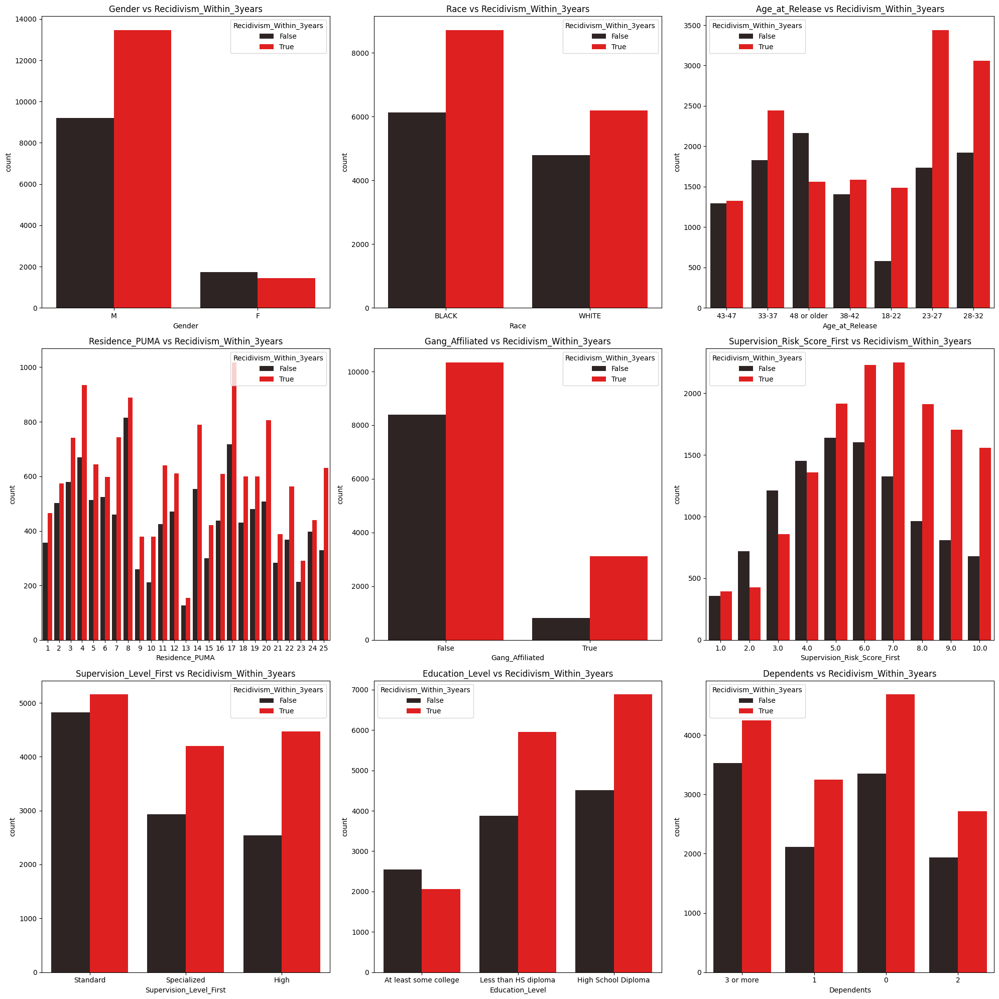

Missing values in the dataset: ID                                                      0
Gender                                                  0
Race                                                    0
Age_at_Release                                          0
Residence_PUMA                                          0
Gang_Affiliated                                      3167
Supervision_Risk_Score_First                          475
Supervision_Level_First                              1720
Education_Level                                         0
Dependents                                              0
Prison_Offense                                       3277
Prison_Years                                            0
Prior_Arrest_Episodes_Felony                            0
Prior_Arrest_Episodes_Misd                              0
Prior_Arrest_Episodes_Violent                           0
Prior_Arrest_Episodes_Property                          0
Prior_Arrest_Episodes_Drug               

In [94]:
""" 
Statistical Summary and Data Analysis for training data.


"""

# Statistical Summary
#print(df_full.describe())

# Data Analysis
# Based on features, variation in data based on the target variable or features. Coorelation between features. The distribution of data points.

# plot in a grid format 
fig, axs = plt.subplots(3, 3, figsize=(20, 20))  # Set up a 3x3 grid of plots
# Flatten the array of axes, so it can be iterated over with a single loop
axs = axs.flatten()
for i, j in enumerate(df_full.columns[1:10]):
    sns.countplot(x=j, data=df_full, hue='Recidivism_Within_3years', ax=axs[i], color='red')
    axs[i].set_title(f'{j} vs Recidivism_Within_3years')

plt.tight_layout()  # Improves appearance a bit.
plt.show()


"""
# Unique values for each feature. plot the count and percentage of each unique value.
for i in df_full.columns[1:10]: # check for specific columns
    print(f'Unique values for {i}: {df_full[i].unique()}')
    print(f'Unique values count for {i}: {df_full[i].nunique()}')
    print(f'Unique values percentage for {i}: {df_full[i].nunique()/df_full.shape[0]}')
    print(f'Unique values percentage for {i}: {df_full[i].value_counts()/df_full.shape[0]}')
    print('---------------------------')
"""


# Missing values in the dataset.
print(f'Missing values in the dataset: {df_full.isnull().sum()}')

In [95]:
""" 
Grouping the features based on context. 

"""
# Assigning each of the groups to a Python variable as lists

# Unique Person
unique_person = [
    "ID"
]

# Supervision Case Information
supervision_case_info = [
    "Gender",
    "Race",
    "Age_at_Release",
    "Residence_PUMA",
    "Gang_Affiliated",
    "Supervision_Risk_Score_First",
    "Supervision_Level_First"
]

# Prison Case Information
prison_case_info = [
    "Education_Level",
    "Dependents",
    "Prison_Offense",
    "Prison_Years"
]

# Prior Georgia Criminal History
prior_ga_criminal_history = [
    "Prior_Arrest_Episodes_Felony",
    "Prior_Arrest_Episodes_Misd",
    "Prior_Arrest_Episodes_Violent",
    "Prior_Arrest_Episodes_Property",
    "Prior_Arrest_Episodes_Drug",
    "Prior_Arrest_Episodes_PPViolationCharges",
    "Prior_Arrest_Episodes_DVCharges",
    "Prior_Arrest_Episodes_GunCharges",
    "Prior_Conviction_Episodes_Felony",
    "Prior_Conviction_Episodes_Misd",
    "Prior_Conviction_Episodes_Viol",
    "Prior_Conviction_Episodes_Prop",
    "Prior_Conviction_Episodes_Drug",
    "Prior_Conviction_Episodes_PPViolationCharges",
    "Prior_Conviction_Episodes_DomesticViolenceCharges",
    "Prior_Conviction_Episodes_GunCharges"
]

# Prior Georgia Community Supervision History
prior_ga_community_supervision_history = [
    "Prior_Revocations_Parole",
    "Prior_Revocations_Probation"
]

# Georgia Board of Pardons and Paroles Conditions of Supervision
ga_board_pardons_paroles_conditions = [
    "Condition_MH_SA",
    "Condition_Cog_Ed",
    "Condition_Other"
]

# Supervision Activities
supervision_activities = [
    "Violations_ElectronicMonitoring",
    "Violations_Instruction",
    "Violations_FailToReport",
    "Violations_MoveWithoutPermission",
    "Delinquency_Reports",
    "Program_Attendances",
    "Program_UnexcusedAbsences",
    "Residence_Changes",
    "Avg_Days_per_DrugTest",
    "DrugTests_THC_Positive",
    "DrugTests_Cocaine_Positive",
    "DrugTests_Meth_Positive",
    "DrugTests_Other_Positive",
    "Percent_Days_Employed",
    "Jobs_Per_Year",
    "Employment_Exempt"
]

# Recidivism Measures
recidivism_measures = [
    "Recidivism_Within_3years",
    "Recidivism_Arrest_Year1",
    "Recidivism_Arrest_Year2",
    "Recidivism_Arrest_Year3"
]

grouped_features = {
    "unique_person": unique_person,
    "supervision_case_info": supervision_case_info,
    "prison_case_info": prison_case_info,
    "prior_ga_criminal_history": prior_ga_criminal_history,
    "prior_ga_community_supervision_history": prior_ga_community_supervision_history,
    "ga_board_pardons_paroles_conditions": ga_board_pardons_paroles_conditions,
    "supervision_activities": supervision_activities,
    "recidivism_measures": recidivism_measures
}


In [96]:
""" 
Category of features based on data type.
"""
# Binary variables (typically 0 or 1, Yes or No)
binary_features = [
    'Gender',  # Assuming M=1, F=0 or similar binary encoding
    'Gang_Affiliated',
    'Prior_Arrest_Episodes_DVCharges',
    'Prior_Arrest_Episodes_GunCharges',
    'Prior_Conviction_Episodes_Viol',
    'Prior_Conviction_Episodes_PPViolationCharges',
    'Prior_Conviction_Episodes_DomesticViolenceCharges',
    'Prior_Conviction_Episodes_GunCharges',
    'Prior_Revocations_Parole',
    'Prior_Revocations_Probation',
    'Condition_MH_SA',
    'Condition_Cog_Ed',
    'Condition_Other',
    'Violations_ElectronicMonitoring',
    'Violations_Instruction',
    'Violations_FailToReport',
    'Violations_MoveWithoutPermission',
    'Employment_Exempt',
    'Recidivism_Within_3years',
    'Recidivism_Arrest_Year1',
    'Recidivism_Arrest_Year2',
    'Recidivism_Arrest_Year3'
]

# Numerical variables (integers or floats)
numerical_features = [
    'Age_at_Release',
    'Supervision_Risk_Score_First',
    'Prior_Arrest_Episodes_Felony',
    'Prior_Arrest_Episodes_Misd',
    'Prior_Arrest_Episodes_Violent',
    'Prior_Arrest_Episodes_Property',
    'Prior_Arrest_Episodes_Drug',
    'Prior_Arrest_Episodes_PPViolationCharges',
    'Prior_Conviction_Episodes_Felony',
    'Prior_Conviction_Episodes_Misd',
    'Prior_Conviction_Episodes_Prop',
    'Prior_Conviction_Episodes_Drug',
    'Delinquency_Reports',
    'Program_Attendances',
    'Program_UnexcusedAbsences',
    'Residence_Changes',
    'Avg_Days_per_DrugTest',
    'DrugTests_THC_Positive',
    'DrugTests_Cocaine_Positive',
    'DrugTests_Meth_Positive',
    'DrugTests_Other_Positive',
    'Percent_Days_Employed',
    'Jobs_Per_Year'
]

# Categorical variables (multiple categories, no intrinsic order)
categorical_features = [
    'Race',
    'Residence_PUMA',
    'Supervision_Level_First',
    'Prison_Offense'
]

# Ordinal variables (multiple categories, with intrinsic order)
ordinal_features = [
    'Education_Level',  # Assuming ordered categories from less to more education
    'Dependents',       # Assuming ordered categories from fewer to more dependents
    'Prison_Years'      # Assuming ordered categories for years spent in prison
]


dtype_features = {
    "binary_features": binary_features,
    "numerical_features": numerical_features,
    "categorical_features": categorical_features,
    "ordinal_features": ordinal_features
}



In [97]:
# Cleaning each group of features and converting them to the correct data type; 

"""
Printing all value and dtype to make decision on cleaning the data.
"""

for feature_group in grouped_features: 
    print(f'Features: {feature_group}: ', grouped_features[feature_group])
    for i in grouped_features[feature_group]:
        print(f'Unique values for {i}: {df_full[i].unique()}')
        print(f'Unique values count for {i}: {df_full[i].nunique()}')
        print(f'Unique values percentage for {i}: {df_full[i].nunique()/df_full.shape[0]}')
        print(f'Unique values percentage for {i}: {df_full[i].value_counts()/df_full.shape[0]}')
        print('---------------------------')
    print('---------------------------------------------------------------------------------------------------------------------------------------')






Features: unique_person:  ['ID']
Unique values for ID: [    1     2     3 ... 26759 26760 26761]
Unique values count for ID: 25835
Unique values percentage for ID: 1.0
Unique values percentage for ID: 1        0.000039
17748    0.000039
17758    0.000039
17757    0.000039
17756    0.000039
           ...   
8819     0.000039
8818     0.000039
8817     0.000039
8816     0.000039
26761    0.000039
Name: ID, Length: 25835, dtype: float64
---------------------------
---------------------------------------------------------------------------------------------------------------------------------------
Features: supervision_case_info:  ['Gender', 'Race', 'Age_at_Release', 'Residence_PUMA', 'Gang_Affiliated', 'Supervision_Risk_Score_First', 'Supervision_Level_First']
Unique values for Gender: ['M' 'F']
Unique values count for Gender: 2
Unique values percentage for Gender: 7.741436036384749e-05
Unique values percentage for Gender: M    0.877414
F    0.122586
Name: Gender, dtype: float64
-------

## Cleaning all features


In [98]:
# copy the dataframe 
df_full_clean = df_full.copy()

# print all dtype of features 
print(f'Data type of features: {df_full.dtypes}')
print("Dtype group: ", dtype_features.keys())

Data type of features: ID                                                     int64
Gender                                                object
Race                                                  object
Age_at_Release                                        object
Residence_PUMA                                         int64
Gang_Affiliated                                       object
Supervision_Risk_Score_First                         float64
Supervision_Level_First                               object
Education_Level                                       object
Dependents                                            object
Prison_Offense                                        object
Prison_Years                                          object
Prior_Arrest_Episodes_Felony                          object
Prior_Arrest_Episodes_Misd                            object
Prior_Arrest_Episodes_Violent                         object
Prior_Arrest_Episodes_Property                        object
P

In [99]:
binary_features = dtype_features['binary_features']
print(f'Binary Features: {binary_features}')

"""
lets clean first: 
-                    Gang_Affiliated: replace nan with False

Rest all binary features are clean.

- Gender is clean 
- Prior_Arrest_Episodes_DVCharges is clean 
- Prior_Arrest_Episodes_GunCharges is clean 
- Prior_Conviction_Episodes_Viol is clean 
- Prior_Conviction_Episodes_PPViolationCharges is clean 
- Prior_Conviction_Episodes_DomesticViolenceCharges is clean 
- Prior_Conviction_Episodes_GunCharges is clean 
- Prior_Revocations_Parole is clean
- Prior_Revocations_Probation is clean 
- Condition_MH_SA is clean 
- Condition_Cog_Ed is clean 
- Condition_Other is clean
- Violations_ElectronicMonitoring is clean 
- Violations_Instruction is clean 
- Violations_FailToReport is clean 
- Violations_MoveWithoutPermission is clean 
- Employment_Exempt is clean 
- Recidivism_Within_3years is clean
- Recidivism_Arrest_Year1 is clean
- Recidivism_Arrest_Year2 is clean
- Recidivism_Arrest_Year3 is clean

"""
# before cleaning 
print(f'Gang_Affiliated before cleaning: {df_full_clean["Gang_Affiliated"].unique()}')

df_full_clean['Gang_Affiliated'].fillna(False, inplace=True)

# check the Gang_Affiliated column
print(f'Gang_Affiliated: {df_full_clean["Gang_Affiliated"].unique()}')



Binary Features: ['Gender', 'Gang_Affiliated', 'Prior_Arrest_Episodes_DVCharges', 'Prior_Arrest_Episodes_GunCharges', 'Prior_Conviction_Episodes_Viol', 'Prior_Conviction_Episodes_PPViolationCharges', 'Prior_Conviction_Episodes_DomesticViolenceCharges', 'Prior_Conviction_Episodes_GunCharges', 'Prior_Revocations_Parole', 'Prior_Revocations_Probation', 'Condition_MH_SA', 'Condition_Cog_Ed', 'Condition_Other', 'Violations_ElectronicMonitoring', 'Violations_Instruction', 'Violations_FailToReport', 'Violations_MoveWithoutPermission', 'Employment_Exempt', 'Recidivism_Within_3years', 'Recidivism_Arrest_Year1', 'Recidivism_Arrest_Year2', 'Recidivism_Arrest_Year3']
Gang_Affiliated before cleaning: [False nan True]
Gang_Affiliated: [False  True]


In [100]:
""" 
Numerical features:
"""
numerical_features = dtype_features['numerical_features']
print(f'Numerical Features: {numerical_features}')


""" 
lets clean first:

- Supervision_Risk_Score_First: nan -- check Supervision_Level_First and choose the value 3 if Supervision_Level_First is Standard, 7 if Supervision_Level_First is High, 9 if Specialized
# Categorical but need here to clean other feature            - Supervision_Level_First: nan -- check Supervision_Risk_Score_First and choose the value Standard if Supervision_Risk_Score_First is between 1 and 5, High if Supervision_Risk_Score_First is between 6 and 8, Specialized if Supervision_Risk_Score_First is between 9 and 10

- Avg_Days_per_DrugTest: nan -- replace with mean if any column of Drug positive test is non-zero!
- DrugTests_THC_Positive: nan -- replace with 0
- DrugTests_Cocaine_Positive: nan -- replace with 0
- DrugTests_Meth_Positive: nan -- replace with 0
- DrugTests_Other_Positive: nan -- replace with 0
- Jobs_Per_Year: nan -- 0 if Percent_Days_Employed is 0 or nan, median if Percent_Days_Employed is more than 0; 
- Percent_Days_Employed: nan -- replace with median if Jobs_Per_Year is more than 0, 0 if Jobs_Per_Year is 0 or nan

- rest all are clean 

"""
# ---------------------------------------------------------------------------------------------------------------------------------- #
# before cleaning
#print(f'Supervision_Level_First before cleaning: {df_full_clean["Supervision_Level_First"].unique()}')
# nan values
print(f'Supervision_Level_First nan values: {df_full_clean["Supervision_Level_First"].isnull().sum()}')


# Fill NaN in 'Supervision_Level_First' based on 'Supervision_Risk_Score_First'
conditions = [
    (df_full_clean['Supervision_Risk_Score_First'].between(1, 5)) & (df_full_clean['Supervision_Level_First'].isna()),
    (df_full_clean['Supervision_Risk_Score_First'].between(6, 8)) & (df_full_clean['Supervision_Level_First'].isna()),
    (df_full_clean['Supervision_Risk_Score_First'].between(9, 10)) & (df_full_clean['Supervision_Level_First'].isna())
]
choices = ['Standard', 'High', 'Specialized']
df_full_clean['Supervision_Level_First'] = np.select(conditions, choices, default=df_full_clean['Supervision_Level_First'])

# post cleaning 
#print(f'Supervision_Level_First after cleaning: {df_full_clean["Supervision_Level_First"].unique()}')

# nan values
print(f'Supervision_Level_First nan values: {df_full_clean["Supervision_Level_First"].isnull().sum()}')

# ---------------------------------------------------------------------------------------------------------------------------------- #
# check the Supervision_Level_First column
#print(f'Supervision_Risk_Score_First before cleaning: {df_full_clean["Supervision_Risk_Score_First"].unique()}')

# nan values
print(f'Supervision_Risk_Score_First nan values: {df_full_clean["Supervision_Risk_Score_First"].isnull().sum()}')

# Fill NaN in 'Supervision_Risk_Score_First' based on 'Supervision_Level_First'
conditions = [
    (df_full_clean['Supervision_Level_First'] == 'Standard') & (df_full_clean['Supervision_Risk_Score_First'].isna()),
    (df_full_clean['Supervision_Level_First'] == 'High') & (df_full_clean['Supervision_Risk_Score_First'].isna()),
    (df_full_clean['Supervision_Level_First'] == 'Specialized') & (df_full_clean['Supervision_Risk_Score_First'].isna())
]
choices = [3, 7, 9]
df_full_clean['Supervision_Risk_Score_First'] = np.select(conditions, choices, default=df_full_clean['Supervision_Risk_Score_First'])

# post cleaning
#print(f'Supervision_Risk_Score_First after cleaning: {df_full_clean["Supervision_Risk_Score_First"].unique()}')

# nan values
print(f'Supervision_Risk_Score_First nan values: {df_full_clean["Supervision_Risk_Score_First"].isnull().sum()}')


# ---------------------------------------------------------------------------------------------------------------------------------- #
# Fill remain superivision related columns with meduan and model based imputation

df_full_clean['Supervision_Risk_Score_First'].fillna(df_full_clean['Supervision_Risk_Score_First'].median(), inplace=True)
df_full_clean['Supervision_Level_First'].fillna(df_full_clean['Supervision_Level_First'].mode()[0], inplace=True)

# post cleaning
print(f'Supervision_Risk_Score_First nan values: {df_full_clean["Supervision_Risk_Score_First"].isnull().sum()}')
print(f'Supervision_Level_First nan values: {df_full_clean["Supervision_Level_First"].isnull().sum()}')

# ---------------------------------------------------------------------------------------------------------------------------------- #

# before cleaning 
#print(f'Avg_Days_per_DrugTest before cleaning: {df_full_clean["Avg_Days_per_DrugTest"].unique()}')
# nan values 
print(f'Avg_Days_per_DrugTest nan values: {df_full_clean["Avg_Days_per_DrugTest"].isnull().sum()}')


# Only replace Nan in 'Avg_Days_per_DrugTest' based on 'DrugTests_THC_Positive', 'DrugTests_Cocaine_Positive', 'DrugTests_Meth_Positive', 'DrugTests_Other_Positive' is those columns are non-zero and non NaN 
# replace nan with mean if any column of Drug positive test is non-zero! 
conditions = [
    (df_full_clean['Avg_Days_per_DrugTest'].isna()) & ((df_full_clean['DrugTests_THC_Positive'] != 0) | (df_full_clean['DrugTests_Cocaine_Positive'] != 0) | (df_full_clean['DrugTests_Meth_Positive'] != 0) | (df_full_clean['DrugTests_Other_Positive'] != 0)),
]
choices = [df_full_clean['Avg_Days_per_DrugTest'].mean()]
df_full_clean['Avg_Days_per_DrugTest'] = np.select(conditions, choices, default=df_full_clean['Avg_Days_per_DrugTest'])
# remaining nan values fill with 0
df_full_clean['Avg_Days_per_DrugTest'].fillna(0, inplace=True)


# post cleaning
print(f'Avg_Days_per_DrugTest after cleaning: {df_full_clean["Avg_Days_per_DrugTest"].unique()}')
# nan values
print(f'Avg_Days_per_DrugTest nan values: {df_full_clean["Avg_Days_per_DrugTest"].isnull().sum()}')

# ---------------------------------------------------------------------------------------------------------------------------------- #

# All drug test related columns; nan replace with 0 
df_full_clean['DrugTests_THC_Positive'].fillna(0, inplace=True)
df_full_clean['DrugTests_Cocaine_Positive'].fillna(0, inplace=True)
df_full_clean['DrugTests_Meth_Positive'].fillna(0, inplace=True)
df_full_clean['DrugTests_Other_Positive'].fillna(0, inplace=True)

# post cleaning; remaining nan count 
print(f'DrugTests_THC_Positive nan values: {df_full_clean["DrugTests_THC_Positive"].isnull().sum()}')
print(f'DrugTests_Cocaine_Positive nan values: {df_full_clean["DrugTests_Cocaine_Positive"].isnull().sum()}')
print(f'DrugTests_Meth_Positive nan values: {df_full_clean["DrugTests_Meth_Positive"].isnull().sum()}')
print(f'DrugTests_Other_Positive nan values: {df_full_clean["DrugTests_Other_Positive"].isnull().sum()}')


# ---------------------------------------------------------------------------------------------------------------------------------- #
# cleaning employment related columns 

# before cleaning
print(f'Percent_Days_Employed nan values: {df_full_clean["Percent_Days_Employed"].isnull().sum()}') 
print(f'Jobs_Per_Year nan values: {df_full_clean["Jobs_Per_Year"].isnull().sum()}')

# Jobs_Per_Year: nan -- 0 if Percent_Days_Employed is 0 or nan, median if Percent_Days_Employed is more than 0;
# Percent_Days_Employed: nan -- replace with median if Jobs_Per_Year is more than 0, 0 if Jobs_Per_Year is 0 or nan
conditions = [
    (df_full_clean['Percent_Days_Employed'].isna()) & ((df_full_clean['Jobs_Per_Year'] != 0)),
]

choices = [df_full_clean['Percent_Days_Employed'].median()]
df_full_clean['Percent_Days_Employed'] = np.select(conditions, choices, default=df_full_clean['Percent_Days_Employed'])

conditions = [
    (df_full_clean['Jobs_Per_Year'].isna()) & ((df_full_clean['Percent_Days_Employed'] != 0)),
]

choices = [df_full_clean['Jobs_Per_Year'].median()]
df_full_clean['Jobs_Per_Year'] = np.select(conditions, choices, default=df_full_clean['Jobs_Per_Year'])

# remaining nan values fill with 0
df_full_clean['Percent_Days_Employed'].fillna(0, inplace=True)
df_full_clean['Jobs_Per_Year'].fillna(0, inplace=True)

# post cleaning
print(f'Percent_Days_Employed nan values: {df_full_clean["Percent_Days_Employed"].isnull().sum()}')
print(f'Jobs_Per_Year nan values: {df_full_clean["Jobs_Per_Year"].isnull().sum()}')

# ---------------------------------------------------------------------------------------------------------------------------------- #




Numerical Features: ['Age_at_Release', 'Supervision_Risk_Score_First', 'Prior_Arrest_Episodes_Felony', 'Prior_Arrest_Episodes_Misd', 'Prior_Arrest_Episodes_Violent', 'Prior_Arrest_Episodes_Property', 'Prior_Arrest_Episodes_Drug', 'Prior_Arrest_Episodes_PPViolationCharges', 'Prior_Conviction_Episodes_Felony', 'Prior_Conviction_Episodes_Misd', 'Prior_Conviction_Episodes_Prop', 'Prior_Conviction_Episodes_Drug', 'Delinquency_Reports', 'Program_Attendances', 'Program_UnexcusedAbsences', 'Residence_Changes', 'Avg_Days_per_DrugTest', 'DrugTests_THC_Positive', 'DrugTests_Cocaine_Positive', 'DrugTests_Meth_Positive', 'DrugTests_Other_Positive', 'Percent_Days_Employed', 'Jobs_Per_Year']
Supervision_Level_First nan values: 1720
Supervision_Level_First nan values: 315
Supervision_Risk_Score_First nan values: 475
Supervision_Risk_Score_First nan values: 315
Supervision_Risk_Score_First nan values: 0
Supervision_Level_First nan values: 0
Avg_Days_per_DrugTest nan values: 6103
Avg_Days_per_DrugTest a

In [101]:
""" 
Category of features based on data type. 

"""
categorical_features = dtype_features['categorical_features']
print(f'Categorical Features: {categorical_features}')

"""
Clean first: 

- Prison Offense: nan -- replace with 'Unknown'


- rest all is clean
""" 

# before cleaning
print(f'Prison_Offense nan values: {df_full_clean["Prison_Offense"].isnull().sum()}')

# Prison Offense: nan -- replace with 'Unknown'
df_full_clean['Prison_Offense'].fillna('Unknown', inplace=True)

# post cleaning
print(f'Prison_Offense nan values: {df_full_clean["Prison_Offense"].isnull().sum()}')




Categorical Features: ['Race', 'Residence_PUMA', 'Supervision_Level_First', 'Prison_Offense']
Prison_Offense nan values: 3277
Prison_Offense nan values: 0


In [102]:
""" 
Ordinal features:

"""
ordinal_features = dtype_features['ordinal_features']
print(f'Ordinal Features: {ordinal_features}')



"""
Clean first: 

- rest all is clean
""" 




Ordinal Features: ['Education_Level', 'Dependents', 'Prison_Years']


'\nClean first: \n\n- rest all is clean\n'

In [103]:
# save the cleaned data 
df_full_clean.to_csv('../data/Recidivism_Full_Dataset_cleaned_shreshth.csv', index=False)



## Convert the data into a format that can be used by the model

1. Binary features into 0 and 1 
2. Categorical features into one hot encoding 
3. Numerical features into normalized values
4. Correct the formatting of text-numerical 
5. oridinal features into one hot encoding 



In [104]:
# Binary features 
binary_features = dtype_features['binary_features']
print(f'Binary Features: {binary_features}')

""" 
Except Gender, rest all are True/False

"""

# Convert True/False to 1/0 and Gender to F/M to categorical 0/1 
# Make binary from M/F categories 

import sklearn 
from sklearn.preprocessing import LabelEncoder

# create an object of the label encoder class
labelencoder = LabelEncoder()

# convert all in given list of columns to binary 
for i in binary_features:
    df_full_clean[i] = labelencoder.fit_transform(df_full_clean[i])

#df_full_clean.head()


Binary Features: ['Gender', 'Gang_Affiliated', 'Prior_Arrest_Episodes_DVCharges', 'Prior_Arrest_Episodes_GunCharges', 'Prior_Conviction_Episodes_Viol', 'Prior_Conviction_Episodes_PPViolationCharges', 'Prior_Conviction_Episodes_DomesticViolenceCharges', 'Prior_Conviction_Episodes_GunCharges', 'Prior_Revocations_Parole', 'Prior_Revocations_Probation', 'Condition_MH_SA', 'Condition_Cog_Ed', 'Condition_Other', 'Violations_ElectronicMonitoring', 'Violations_Instruction', 'Violations_FailToReport', 'Violations_MoveWithoutPermission', 'Employment_Exempt', 'Recidivism_Within_3years', 'Recidivism_Arrest_Year1', 'Recidivism_Arrest_Year2', 'Recidivism_Arrest_Year3']


In [105]:
# Categorical features
categorical_features = dtype_features['categorical_features']
print(f'Categorical Features: {categorical_features}')

# Convert categorical features to one-hot encoding 
# create an object of the one-hot encoder class

# convert all in given list of columns to one-hot encoding
for i in categorical_features:
    df_full_clean[i] = labelencoder.fit_transform(df_full_clean[i])


Categorical Features: ['Race', 'Residence_PUMA', 'Supervision_Level_First', 'Prison_Offense']


In [106]:
# Ordinal features
ordinal_features = dtype_features['ordinal_features']
print(f'Ordinal Features: {ordinal_features}')

# Convert ordinal features to ordinal encoding
df_full_clean['Education_Level'] = labelencoder.fit_transform(df_full_clean['Education_Level'])

# "1" convert to int.  and 3 or more convert to 3 
df_full_clean['Dependents'] = df_full_clean['Dependents'].replace(
    '3 or more', 3).astype(int)

df_full_clean['Prison_Years'] = df_full_clean['Prison_Years'].replace(
    {'More than 3 years': 4, 
    '1-2 years': 2,
    'Less than 1 year': 1,
    'Greater than 2 to 3 years': 3}
    ).astype(int)


Ordinal Features: ['Education_Level', 'Dependents', 'Prison_Years']


In [107]:
# Numerical features 
numerical_features = dtype_features['numerical_features']
print(f'Numerical Features: {numerical_features}')

# Age_at_Release: take mid value of the range and for 48 or older take median of 48-70 range that is 59
df_full_clean['Age_at_Release'] = df_full_clean['Age_at_Release'].replace(
    {'Less than 18': 18,
    '18-22': 20,
    '23-27': 25,
    '28-32': 30,
    '33-37': 35,
    '38-42': 40,
    '43-47': 45,
    '48 or older': 59}
    ).astype(int)

# Prison_Arrest_Episodes_Felony: for 10_more take 10
df_full_clean['Prior_Arrest_Episodes_Felony'] = df_full_clean['Prior_Arrest_Episodes_Felony'].replace(
    {'10 or more': 10}
    ).astype(int)

# Prison_Arrest_Episodes_Misd: for 6_or_more take 6
df_full_clean['Prior_Arrest_Episodes_Misd'] = df_full_clean['Prior_Arrest_Episodes_Misd'].replace(
    {'6 or more': 6}
    ).astype(int)

# Prison_Arrest_Episodes_Violent: for 3_or_more take 3
df_full_clean['Prior_Arrest_Episodes_Violent'] = df_full_clean['Prior_Arrest_Episodes_Violent'].replace(
    {'3 or more': 3}
    ).astype(int)

# Prison_Arrest_Episodes_Property: for 5 or more take 5
df_full_clean['Prior_Arrest_Episodes_Property'] = df_full_clean['Prior_Arrest_Episodes_Property'].replace(
    {'5 or more': 5}
    ).astype(int)

# Prison_Arrest_Episodes_Drug: for 5 or more take 5
df_full_clean['Prior_Arrest_Episodes_Drug'] = df_full_clean['Prior_Arrest_Episodes_Drug'].replace(
    {'5 or more': 5}
    ).astype(int)

# Prison_Arrest_Episodes_PPViolationCharges: for 5 or more take 5
df_full_clean['Prior_Arrest_Episodes_PPViolationCharges'] = df_full_clean['Prior_Arrest_Episodes_PPViolationCharges'].replace(
    {'5 or more': 5}
    ).astype(int)

# Prior_Conviction_Episodes_Felony: for 3 or more take 3
df_full_clean['Prior_Conviction_Episodes_Felony'] = df_full_clean['Prior_Conviction_Episodes_Felony'].replace(
    {'3 or more': 3}
    ).astype(int)

# Prior_Conviction_Episodes_Misd: for 4 or more take 4
df_full_clean['Prior_Conviction_Episodes_Misd'] = df_full_clean['Prior_Conviction_Episodes_Misd'].replace(
    {'4 or more': 4}
    ).astype(int)

# Prior_Conviction_Episodes_Prop: for 3 or more take 3
df_full_clean['Prior_Conviction_Episodes_Prop'] = df_full_clean['Prior_Conviction_Episodes_Prop'].replace(
    {'3 or more': 3}
    ).astype(int)

# Prior_Conviction_Episodes_Drug: for 2 or more take 2
df_full_clean['Prior_Conviction_Episodes_Drug'] = df_full_clean['Prior_Conviction_Episodes_Drug'].replace(
    {'2 or more': 2}
    ).astype(int)

# Delinquency_Reports: for 4 or more take 4
df_full_clean['Delinquency_Reports'] = df_full_clean['Delinquency_Reports'].replace(
    {'4 or more': 4}
    ).astype(int)

# Program_Attendances: for 10 or more take 10
df_full_clean['Program_Attendances'] = df_full_clean['Program_Attendances'].replace(
    {'10 or more': 10}
    ).astype(int)

# Program_UnexcusedAbsences: for 3 or more take 3
df_full_clean['Program_UnexcusedAbsences'] = df_full_clean['Program_UnexcusedAbsences'].replace(
    {'3 or more': 3}
    ).astype(int)

# Residence_Changes: for 3 or more take 3
df_full_clean['Residence_Changes'] = df_full_clean['Residence_Changes'].replace(
    {'3 or more': 3}
    ).astype(int)



Numerical Features: ['Age_at_Release', 'Supervision_Risk_Score_First', 'Prior_Arrest_Episodes_Felony', 'Prior_Arrest_Episodes_Misd', 'Prior_Arrest_Episodes_Violent', 'Prior_Arrest_Episodes_Property', 'Prior_Arrest_Episodes_Drug', 'Prior_Arrest_Episodes_PPViolationCharges', 'Prior_Conviction_Episodes_Felony', 'Prior_Conviction_Episodes_Misd', 'Prior_Conviction_Episodes_Prop', 'Prior_Conviction_Episodes_Drug', 'Delinquency_Reports', 'Program_Attendances', 'Program_UnexcusedAbsences', 'Residence_Changes', 'Avg_Days_per_DrugTest', 'DrugTests_THC_Positive', 'DrugTests_Cocaine_Positive', 'DrugTests_Meth_Positive', 'DrugTests_Other_Positive', 'Percent_Days_Employed', 'Jobs_Per_Year']


In [108]:
#check nan values 
for name_feat in numerical_features:# "Prior_Arrest_Episodes_DVCharges"
    print("Nan values: " , df_full_clean[name_feat].isnull().sum())
    print(df_full_clean[name_feat].unique())

Nan values:  0
[45 35 59 40 20 25 30]
Nan values:  0
[ 3.  6.  7.  4.  5.  2.  1. 10.  9.  8.]
Nan values:  0
[ 6  7  8  4 10  3  9  2  5  1  0]
Nan values:  0
[6 4 0 1 3 5 2]
Nan values:  0
[1 3 0 2]
Nan values:  0
[3 0 2 5 1 4]
Nan values:  0
[3 2 1 0 5 4]
Nan values:  0
[4 5 3 0 1 2]
Nan values:  0
[3 1 2 0]
Nan values:  0
[3 4 2 0 1]
Nan values:  0
[2 0 1 3]
Nan values:  0
[2 1 0]
Nan values:  0
[0 4 3 2 1]
Nan values:  0
[ 6  0  7  9 10  2  1  5  3  4  8]
Nan values:  0
[0 2 3 1]
Nan values:  0
[2 0 3 1]
Nan values:  0
[612.          35.66666667  93.66666667 ...  37.64       127.7
  58.1       ]
Nan values:  0
[0.         0.33333334 0.30000001 0.04       0.05       1.
 0.2857143  0.06666667 0.14285715 0.06       0.06060606 0.5
 0.21052632 0.5714286  0.25       0.12121213 0.04545455 0.07142857
 0.1        0.375      0.2        0.125      0.02207505 0.06896552
 0.11111111 0.07692308 0.22222222 0.08333334 0.09090909 0.16666667
 0.02564103 0.04878049 0.17391305 0.02222222 0.23529412 0

# New Features and Feature Engineering 
Now that we have cleaned the data and converted all datatypes to numerical (binary,categorical and numerical). We can create new features and do feature engineering.


In [109]:
""" 
We can create a simplied Drug related feature. 

"Required_Drug_Tests": 1 if Avg_Days_per_DrugTest is more than 0 else 0 

""" 
df_full_clean['Required_Drug_Tests'] = np.where(df_full_clean['Avg_Days_per_DrugTest'] > 0, 1, 0)


In [110]:

""" 
Relative years spent in prison. 

"""
# Prison_Years_Pct_Age: The percentage of the Parolee's lifetime spent in prison. Prison_Years / Age_at_Release
df_full_clean['Prison_Years_Pct_Age'] = df_full_clean['Prison_Years'] / df_full_clean['Age_at_Release']


In [111]:
""" 
Criminal History Summary:

- Prior_Arrest_Sum: sum of all prior arrest episodes 
- Prior_Conviction_Sum: sum of all prior conviction episodes


"""

# Summarize prior arrest episodes by category
df_full_clean['Prior_Arrest_Sum'] = df_full_clean[['Prior_Arrest_Episodes_Felony', 'Prior_Arrest_Episodes_Misd',
                             'Prior_Arrest_Episodes_Violent', 'Prior_Arrest_Episodes_Property',
                             'Prior_Arrest_Episodes_Drug']].sum(axis=1)

# Summarize prior conviction episodes by category
df_full_clean['Prior_Conviction_Sum'] = df_full_clean[['Prior_Conviction_Episodes_Felony', 'Prior_Conviction_Episodes_Misd',
                                 'Prior_Conviction_Episodes_Viol', 'Prior_Conviction_Episodes_Prop',
                                 'Prior_Conviction_Episodes_Drug']].sum(axis=1)





In [112]:
""" 
Violation Summary: 

- Violations_Sum: sum of all violations

""" 

# Summarize violations by category
df_full_clean['Violations_Sum'] = df_full_clean[['Violations_ElectronicMonitoring', 'Violations_Instruction',
                           'Violations_FailToReport', 'Violations_MoveWithoutPermission']].sum(axis=1)


In [113]:
""" 
Program Attendance Summary: 

Ratio of program attendance to program opportunities

"""

# Ratio of program attendance to program opportunities
df_full_clean['Program_Attendance_Ratio'] = df_full_clean['Program_Attendances'] / (df_full_clean['Program_Attendances'] + df_full_clean['Program_UnexcusedAbsences'])
# Replace NaN with 0; division by 0 results in NaN
df_full_clean['Program_Attendance_Ratio'].fillna(0, inplace=True)


In [114]:
""" 
Indicator for Employment: 1 if Percent_Days_Employed is more than 0 else 0
"""

# Indicator for Employment
df_full_clean['Employed_Indicator'] = (df_full_clean['Percent_Days_Employed'] > 0).astype(int)




In [115]:
""" 
Total Drug Tests: sum of all drug tests

"""

# Summarize drug tests by category
df_full_clean['Total_Drug_Tests'] = df_full_clean[['DrugTests_THC_Positive', 'DrugTests_Cocaine_Positive',
                           'DrugTests_Meth_Positive', 'DrugTests_Other_Positive']].sum(axis=1)




In [116]:
""" 
If the address change is 0 but Violations_MoveWithoutPermission is non-zero, then we can assume that the address change was not reported.

"""

# If the address change is 0 but Violations_MoveWithoutPermission is non-zero, then we can assume that the address change was not reported.
df_full_clean['Residence_Change_Violation'] = np.where((df_full_clean['Residence_Changes'] == 0) & (df_full_clean['Violations_MoveWithoutPermission'] > 0), 1, 0)


""" 
Prior_Arrest_Episodes_Felony_violation: Parolee has 0 prior felony arrests, yet they
have more than 0 felony convictions.


"""

# Prior_Arrest_Episodes_Felony_violation: Parolee has 0 prior felony arrests, yet they have more than 0 felony convictions.
df_full_clean['Prior_Arrest_Episodes_Felony_violation'] = np.where((df_full_clean['Prior_Arrest_Episodes_Felony'] == 0) & (df_full_clean['Prior_Conviction_Episodes_Felony'] > 0), 1, 0)



In [117]:
""" 
Similary for all violation/violationancy related features. 

"""
# Prior_Arrest_Episodes_Misd_violation: Parolee has 0 prior misdemeanor arrests, yet they have more than 0 misdemeanor convictions.
df_full_clean['Prior_Arrest_Episodes_Misd_violation'] = np.where((df_full_clean['Prior_Arrest_Episodes_Misd'] == 0) & (df_full_clean['Prior_Conviction_Episodes_Misd'] > 0), 1, 0)

# Prior_Arrest_Episodes_Violent_violation: Parolee has 0 prior violent arrests, yet they have more than 0 violent convictions.
df_full_clean['Prior_Arrest_Episodes_Violent_violation'] = np.where((df_full_clean['Prior_Arrest_Episodes_Violent'] == 0) & (df_full_clean['Prior_Conviction_Episodes_Viol'] > 0), 1, 0)

# Prior_Arrest_Episodes_Property_violation: Parolee has 0 prior property arrests, yet they have more than 0 property convictions.
df_full_clean['Prior_Arrest_Episodes_Property_violation'] = np.where((df_full_clean['Prior_Arrest_Episodes_Property'] == 0) & (df_full_clean['Prior_Conviction_Episodes_Prop'] > 0), 1, 0)

# Prior_Arrest_Episodes_Drug_violation: Parolee has 0 prior drug arrests, yet they have more than 0 drug convictions.
df_full_clean['Prior_Arrest_Episodes_Drug_violation'] = np.where((df_full_clean['Prior_Arrest_Episodes_Drug'] == 0) & (df_full_clean['Prior_Conviction_Episodes_Drug'] > 0), 1, 0)

# Prior_Arrest_Episodes_PPViolationCharges_violation: Parolee has 0 prior PP violation charge arrests, yet they have more than 0 PP violation charge convictions.
df_full_clean['Prior_Arrest_Episodes_PPViolationCharges_violation'] = np.where((df_full_clean['Prior_Arrest_Episodes_PPViolationCharges'] == 0) & (df_full_clean['Prior_Conviction_Episodes_PPViolationCharges'] > 0), 1, 0)

# Prior_Arrest_Episodes_DVCharges_violation: Parolee has 0 prior DV charge arrests, yet they have more than 0 DV charge convictions.
df_full_clean['Prior_Arrest_Episodes_DVCharges_violation'] = np.where((df_full_clean['Prior_Arrest_Episodes_DVCharges'] == 0) & (df_full_clean['Prior_Conviction_Episodes_DomesticViolenceCharges'] > 0), 1, 0)

# Prior_Arrest_Episodes_GunCharges_violation: Parolee has 0 prior gun charge arrests, yet they have more than 0 gun charge convictions.
df_full_clean['Prior_Arrest_Episodes_GunCharges_violation'] = np.where((df_full_clean['Prior_Arrest_Episodes_GunCharges'] == 0) & (df_full_clean['Prior_Conviction_Episodes_GunCharges'] > 0), 1, 0)



In [118]:
df_full_clean.to_csv('../data/Recvidism_extra_feat_prepared.csv', index=False)

# Preparing data for Model training 


In [119]:
# Load the dataframe 

df_full_clean = pd.read_csv('../data/Recvidism_extra_feat_prepared.csv')
df_full_clean

,ID,Gender,Race,Age_at_Release,Residence_PUMA,Gang_Affiliated,Supervision_Risk_Score_First,Supervision_Level_First,Education_Level,Dependents,...,Total_Drug_Tests,Residence_Change_Violation,Prior_Arrest_Episodes_Felony_violation,Prior_Arrest_Episodes_Misd_violation,Prior_Arrest_Episodes_Violent_violation,Prior_Arrest_Episodes_Property_violation,Prior_Arrest_Episodes_Drug_violation,Prior_Arrest_Episodes_PPViolationCharges_violation,Prior_Arrest_Episodes_DVCharges_violation,Prior_Arrest_Episodes_GunCharges_violation
0,1,1,0,45,15,0,3.0,2,0,3,...,0.000000,0,0,0,0,0,0,0,0,0
1,2,1,0,35,15,0,6.0,1,2,1,...,0.000000,0,0,0,0,0,0,0,0,1
2,3,1,0,59,23,0,7.0,0,0,3,...,0.500000,1,0,0,0,0,0,0,0,0
3,4,1,1,40,15,0,7.0,0,2,1,...,0.000000,0,0,0,0,0,0,0,0,0
4,5,1,1,35,15,0,4.0,1,2,3,...,0.058824,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25830,26756,1,0,25,8,0,5.0,2,0,1,...,0.000000,0,0,0,0,0,0,0,0,0
25831,26758,1,1,40,24,0,5.0,2,0,3,...,0.000000,0,0,0,0,0,0,0,0,0
25832,26759,1,0,35,14,0,5.0,2,0,3,...,0.000000,0,0,0,0,0,0,0,0,0
25833,26760,0,1,35,14,0,5.0,2,0,3,...,0.000000,0,0,0,0,0,0,0,0,0


In [120]:
""" 
We are predicting the recidivism within 3 years. 

Remove columns related to recidivism in 1, 2, 3 years.
"""

# Remove columns related to recidivism in 1, 2, 3 years
df_full_clean.drop(columns=['Recidivism_Arrest_Year1', 'Recidivism_Arrest_Year2', 'Recidivism_Arrest_Year3'], inplace=True)


In [121]:
# check the numerical data distribution before scaling; 
""" 

# check the distribution of the numerical features before scaling 
for i in numerical_features:
    print(f'Feature: {i}')
    print(f'Mean: {df_full_clean[i].mean()}')
    print(f'Median: {df_full_clean[i].median()}')
    print(f'Mode: {df_full_clean[i].mode()[0]}')
    print(f'Standard Deviation: {df_full_clean[i].std()}')
    print(f'Minimum: {df_full_clean[i].min()}')
    print(f'Maximum: {df_full_clean[i].max()}')
    print(f'25th percentile: {df_full_clean[i].quantile(0.25)}')
    print(f'50th percentile: {df_full_clean[i].quantile(0.50)}')
    print(f'75th percentile: {df_full_clean[i].quantile(0.75)}')
    print(f'90th percentile: {df_full_clean[i].quantile(0.90)}')
    print(f'95th percentile: {df_full_clean[i].quantile(0.95)}')
    print(f'99th percentile: {df_full_clean[i].quantile(0.99)}')
    print(f'99.5th percentile: {df_full_clean[i].quantile(0.995)}')
    print(f'99.9th percentile: {df_full_clean[i].quantile(0.999)}')
    print('---------------------------')

    # plot the distribution of the numerical features 
    plt.figure(figsize=(10, 5))
    sns.distplot(df_full_clean[i])
    plt.title(f'Distribution of {i}')

    # plot the boxplot of the numerical features
    plt.figure(figsize=(10, 5))
    sns.boxplot(df_full_clean[i])
    plt.title(f'Boxplot of {i}')

    # plot the histogram of the numerical features
    plt.figure(figsize=(10, 5))
    sns.histplot(df_full_clean[i])
    
    plt.title(f'Histogram of {i}')
    plt.hist(df_full_clean[i], bins=20)
    plt.show()
    


"""

# features to normalize 
numerical_features = dtype_features['numerical_features']
for name_feat in numerical_features: 
    print(name_feat)
    print("Nan values: " , df_full_clean[name_feat].isnull().sum())
    #print(df_full_clean[name_feat].unique())

Age_at_Release
Nan values:  0
Supervision_Risk_Score_First
Nan values:  0
Prior_Arrest_Episodes_Felony
Nan values:  0
Prior_Arrest_Episodes_Misd
Nan values:  0
Prior_Arrest_Episodes_Violent
Nan values:  0
Prior_Arrest_Episodes_Property
Nan values:  0
Prior_Arrest_Episodes_Drug
Nan values:  0
Prior_Arrest_Episodes_PPViolationCharges
Nan values:  0
Prior_Conviction_Episodes_Felony
Nan values:  0
Prior_Conviction_Episodes_Misd
Nan values:  0
Prior_Conviction_Episodes_Prop
Nan values:  0
Prior_Conviction_Episodes_Drug
Nan values:  0
Delinquency_Reports
Nan values:  0
Program_Attendances
Nan values:  0
Program_UnexcusedAbsences
Nan values:  0
Residence_Changes
Nan values:  0
Avg_Days_per_DrugTest
Nan values:  0
DrugTests_THC_Positive
Nan values:  0
DrugTests_Cocaine_Positive
Nan values:  0
DrugTests_Meth_Positive
Nan values:  0
DrugTests_Other_Positive
Nan values:  0
Percent_Days_Employed
Nan values:  0
Jobs_Per_Year
Nan values:  0


In [122]:

""" 
Normalize the numerical features. 

NOTE: Age_at_Release is in numerical features list but it is ordinal feature, so don't normalize it. either use it directly or convert it to categorical feature.(later to compare the difference)
NOTE: Conclusion for numerical distribution of features: None follow normal distribution. So we will use MinMaxScaler to normalize the numerical features.
"""

# Normalizing the numerical features 
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

# Normalize the numerical features
numerical_features = dtype_features['numerical_features']
#numerical_features.remove('Age_at_Release')

# create an object of the MinMaxScaler class
scaler = MinMaxScaler()

# fit and transform the data
df_full_clean[numerical_features] = scaler.fit_transform(df_full_clean[numerical_features])

df_full_clean.head()



,ID,Gender,Race,Age_at_Release,Residence_PUMA,Gang_Affiliated,Supervision_Risk_Score_First,Supervision_Level_First,Education_Level,Dependents,...,Total_Drug_Tests,Residence_Change_Violation,Prior_Arrest_Episodes_Felony_violation,Prior_Arrest_Episodes_Misd_violation,Prior_Arrest_Episodes_Violent_violation,Prior_Arrest_Episodes_Property_violation,Prior_Arrest_Episodes_Drug_violation,Prior_Arrest_Episodes_PPViolationCharges_violation,Prior_Arrest_Episodes_DVCharges_violation,Prior_Arrest_Episodes_GunCharges_violation
0,1,1,0,0.641026,15,0,0.222222,2,0,3,...,0.000000,0,0,0,0,0,0,0,0,0
1,2,1,0,0.384615,15,0,0.555556,1,2,1,...,0.000000,0,0,0,0,0,0,0,0,1
2,3,1,0,1.000000,23,0,0.666667,0,0,3,...,0.500000,1,0,0,0,0,0,0,0,0
3,4,1,1,0.512821,15,0,0.666667,0,2,1,...,0.000000,0,0,0,0,0,0,0,0,0
4,5,1,1,0.384615,15,0,0.333333,1,2,3,...,0.058824,0,0,0,0,0,0,0,0,0


#### Train Test Split 
1. There's Feature called Training_Sample to separate the train and test data. 


In [123]:
""" 
Train Test Split 

"""

# Split the data into train and test sets 

df_train_split = df_full_clean[df_full_clean['Training_Sample']==1]
df_test_split = df_full_clean[df_full_clean['Training_Sample']==0]

# drop the Training_Sample column
df_train_split.drop(columns=['Training_Sample'], inplace=True)
df_test_split.drop(columns=['Training_Sample'], inplace=True)

# check the shape of the train and test data
print(f'Shape of train data: {df_train_split.shape}')
print(f'Shape of test data: {df_test_split.shape}')

# ratio of train and test data 
#print(f'Ratio of train and test data: {df_test_split.shape[0]/df_train_split.shape[0]}')
# ratio with total data 
print(f'Ratio of train and test data: {df_test_split.shape[0]/df_full_clean.shape[0]}')


# check the target variable distribution in train and test data
print(f'Ratio of target variable in train data: {df_train_split["Recidivism_Within_3years"].sum()/df_train_split.shape[0]}')
print(f'Ratio of target variable in test data: {df_test_split["Recidivism_Within_3years"].sum()/df_test_split.shape[0]}')

# Very good balance of target variable in train and test data.


Shape of train data: (18028, 67)
Shape of test data: (7807, 67)
Ratio of train and test data: 0.3021869556802787
Ratio of target variable in train data: 0.5780452629243399
Ratio of target variable in test data: 0.5742282566927117


In [124]:
# Saving the train and test data 

# drop the ID column 
df_train_split.drop(columns=['ID'], inplace=True)
df_test_split.drop(columns=['ID'], inplace=True)


df_train_split.to_csv('../data/Recvidism_extra_feat_train.csv', index=False)
df_test_split.to_csv('../data/Recvidism_extra_feat_test.csv', index=False)


In [125]:
df_train_split.columns 

Index(['Gender', 'Race', 'Age_at_Release', 'Residence_PUMA', 'Gang_Affiliated',
       'Supervision_Risk_Score_First', 'Supervision_Level_First',
       'Education_Level', 'Dependents', 'Prison_Offense', 'Prison_Years',
       'Prior_Arrest_Episodes_Felony', 'Prior_Arrest_Episodes_Misd',
       'Prior_Arrest_Episodes_Violent', 'Prior_Arrest_Episodes_Property',
       'Prior_Arrest_Episodes_Drug',
       'Prior_Arrest_Episodes_PPViolationCharges',
       'Prior_Arrest_Episodes_DVCharges', 'Prior_Arrest_Episodes_GunCharges',
       'Prior_Conviction_Episodes_Felony', 'Prior_Conviction_Episodes_Misd',
       'Prior_Conviction_Episodes_Viol', 'Prior_Conviction_Episodes_Prop',
       'Prior_Conviction_Episodes_Drug',
       'Prior_Conviction_Episodes_PPViolationCharges',
       'Prior_Conviction_Episodes_DomesticViolenceCharges',
       'Prior_Conviction_Episodes_GunCharges', 'Prior_Revocations_Parole',
       'Prior_Revocations_Probation', 'Condition_MH_SA', 'Condition_Cog_Ed',
       'Con

# Final Data Analysis and Visualization 


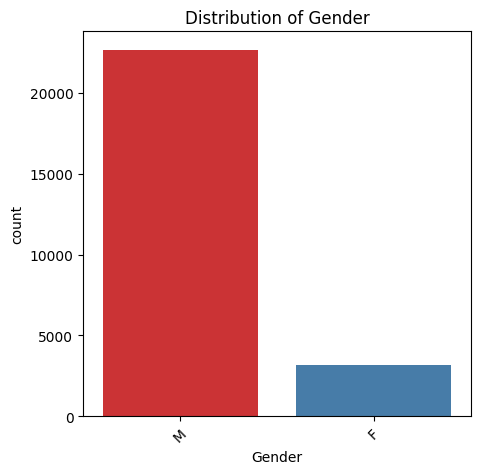

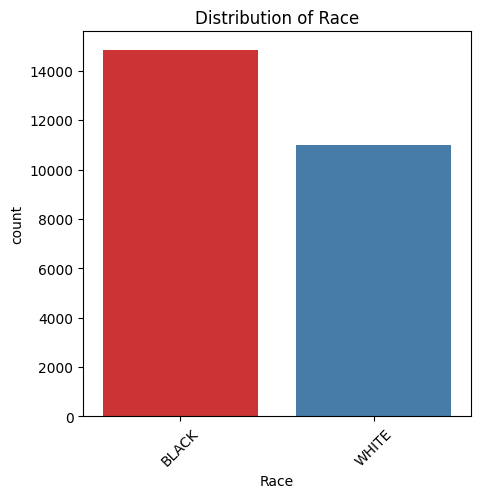

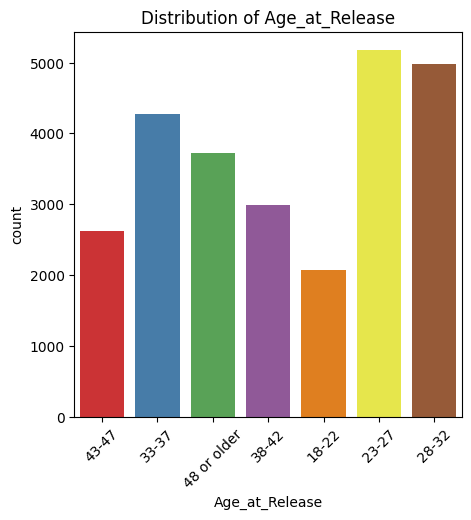

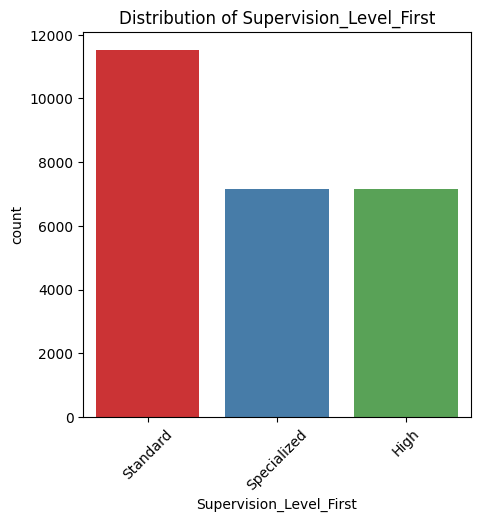

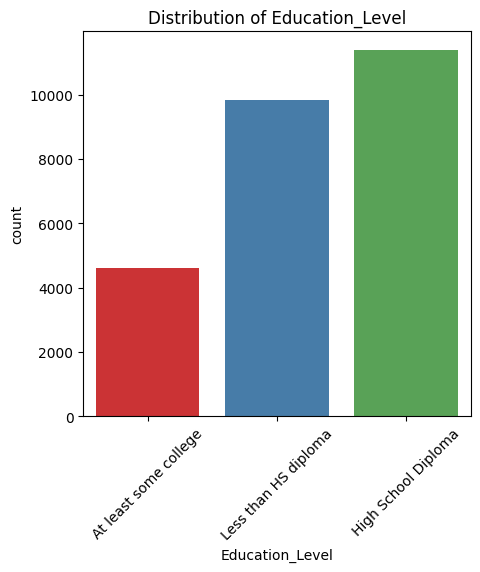

...

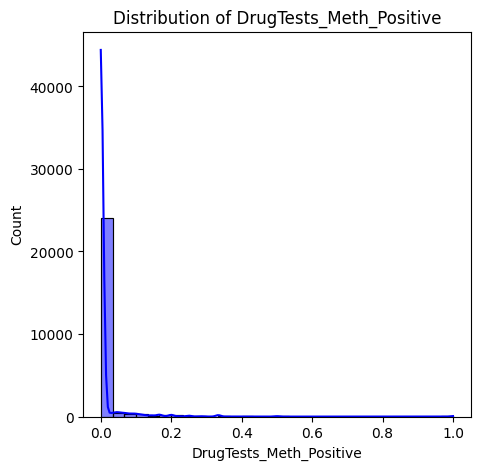

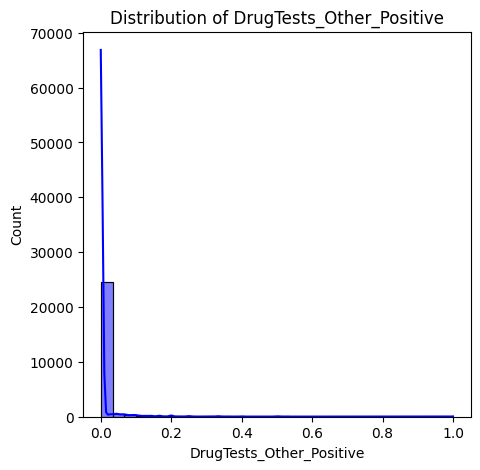

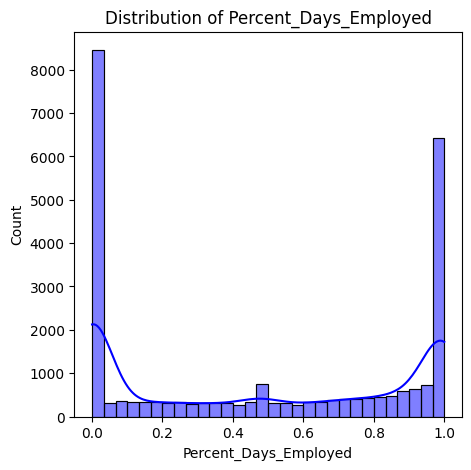

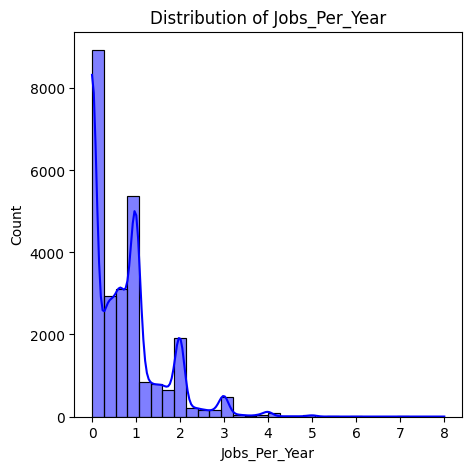

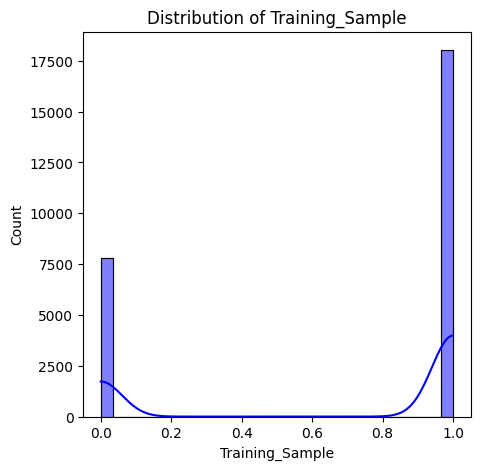

<Figure size 500x500 with 0 Axes>

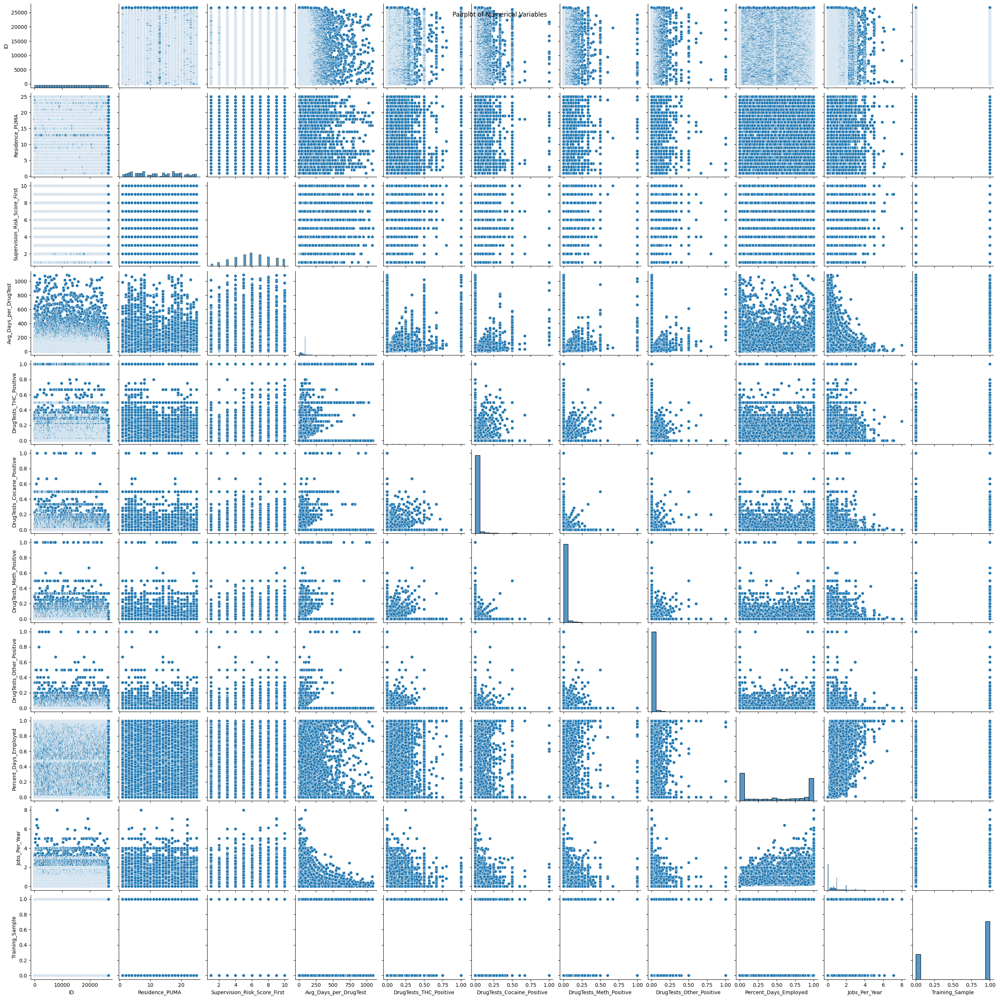

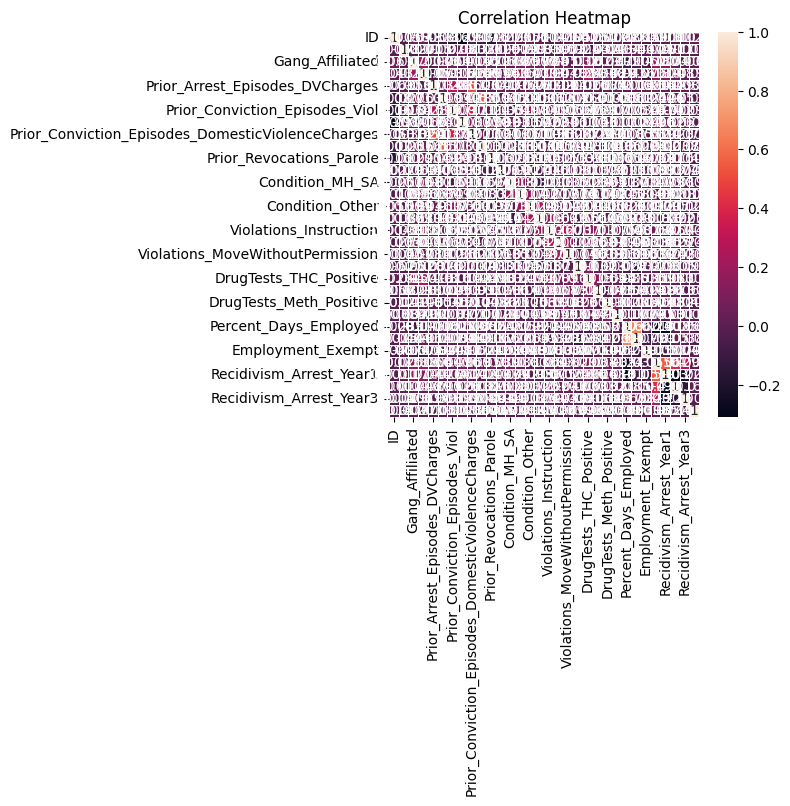

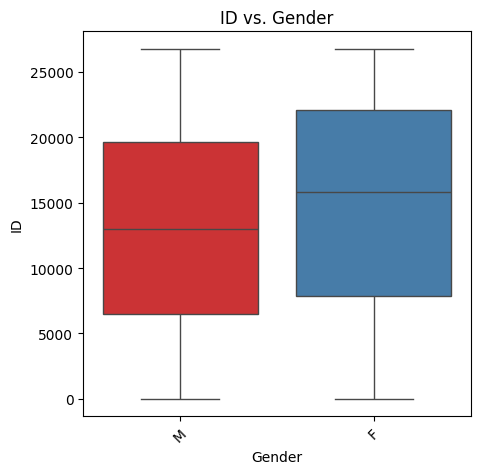

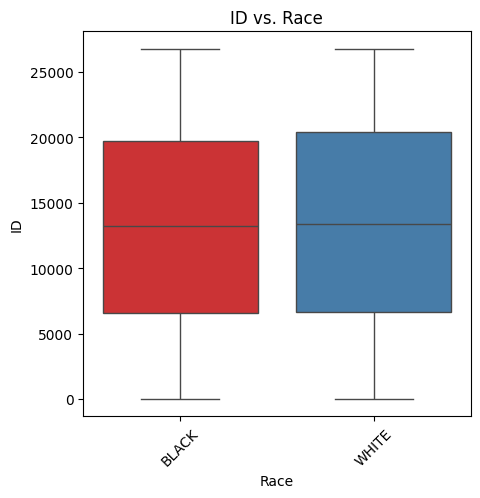

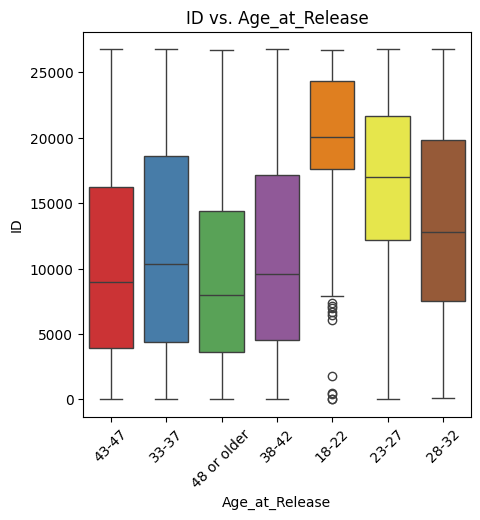

...

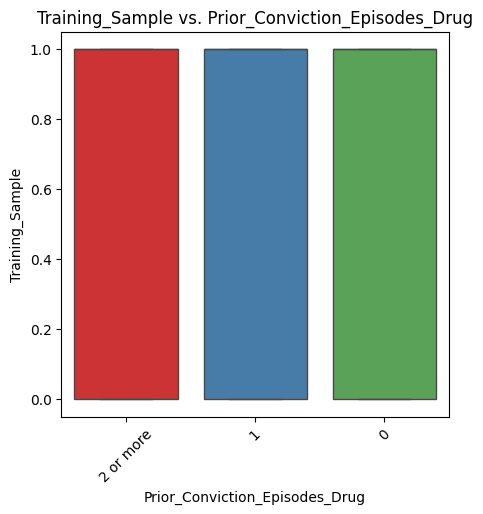

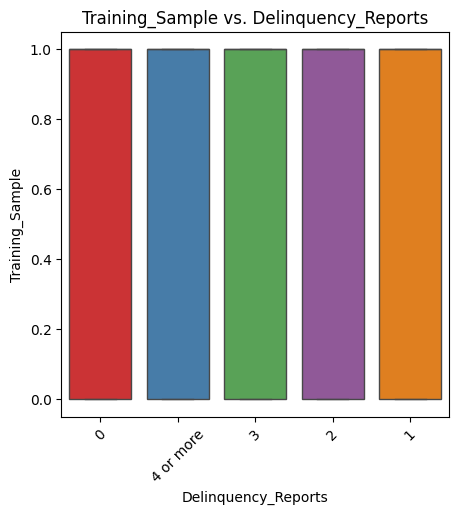

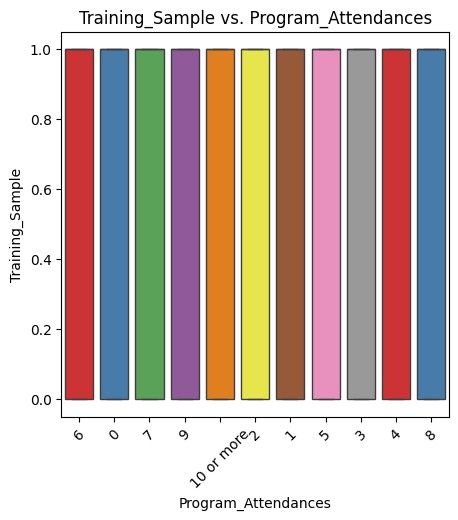

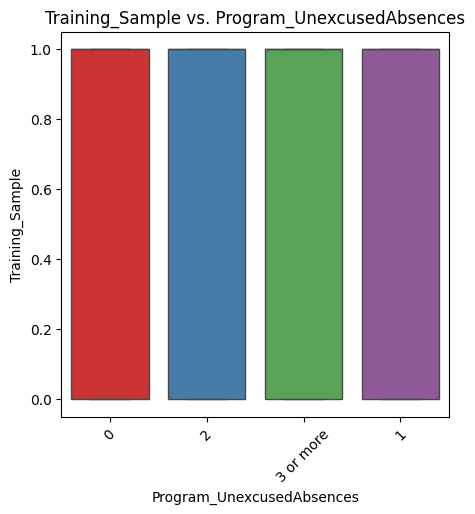

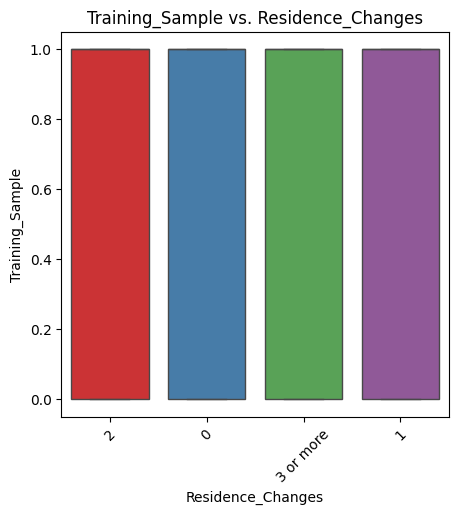

In [147]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load your dataset (replace 'your_data.csv' with your data file)
df = pd.read_csv('../data/Recidivism_Full_Dataset_cleaned_shreshth.csv')
# drop ID and Training_Sample columns 
df.drop(columns=['ID', 'Training_Sample'], inplace=True)

# Summary statistics
summary_stats = df.describe()

# Correlation matrix
correlation_matrix = df.corr()

# Distribution of categorical variables
categorical_columns = df.select_dtypes(include=['object']).columns
for col in categorical_columns:
    plt.figure(figsize=(5, 5))
    sns.countplot(data=df, x=col, palette='Set1')
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=45)
    plt.show()

# Distribution of numerical variables
numerical_columns = df.select_dtypes(include=['int', 'float']).columns
for col in numerical_columns:
    plt.figure(figsize=(5, 5))
    sns.histplot(data=df, x=col, bins=30, kde=True, color='blue')
    plt.title(f'Distribution of {col}')
    plt.show()

# Pairplot for numerical variables
plt.figure(figsize=(5, 5))
sns.pairplot(df[numerical_columns], palette='Set1')
plt.suptitle('Pairplot of Numerical Variables')
plt.show()

# Correlation heatmap
plt.figure(figsize=(5, 5))
sns.heatmap(correlation_matrix, annot=True, linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

# Box plots for numerical variables vs. categorical variables
for col in numerical_columns:
    for cat_col in categorical_columns:
        plt.figure(figsize=(5, 5))
        sns.boxplot(data=df, x=cat_col, y=col, palette='Set1')
        plt.title(f'{col} vs. {cat_col}')
        plt.xticks(rotation=45)
        plt.show()



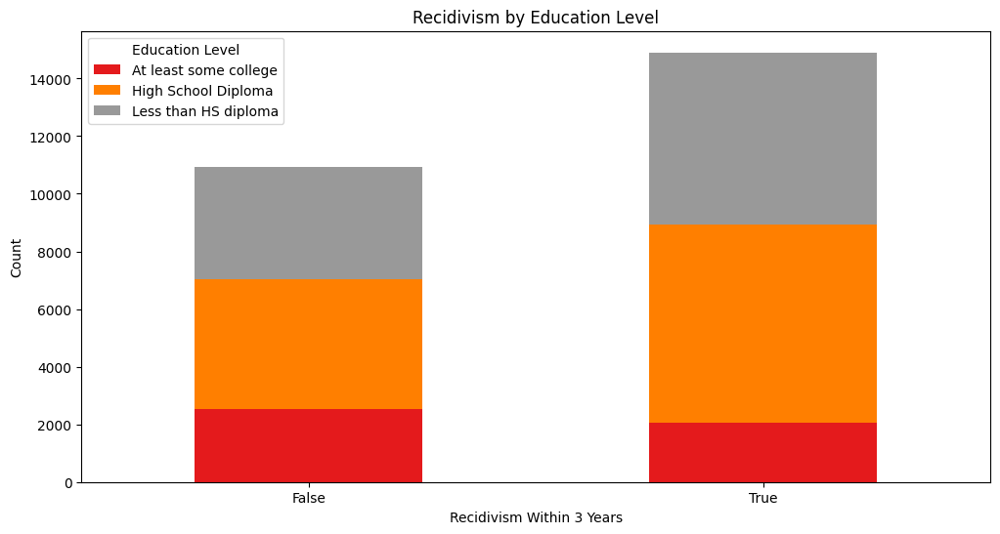

In [149]:
""" 
Recidivism distribution by Education Level
"""

recidivism_education = df.groupby(['Recidivism_Within_3years', 'Education_Level']).size().unstack().fillna(0)
recidivism_education.plot(kind='bar', stacked=True, colormap='Set1', figsize=(12, 6))
plt.title('Recidivism by Education Level')
plt.xlabel('Recidivism Within 3 Years')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend(title='Education Level')
plt.show()


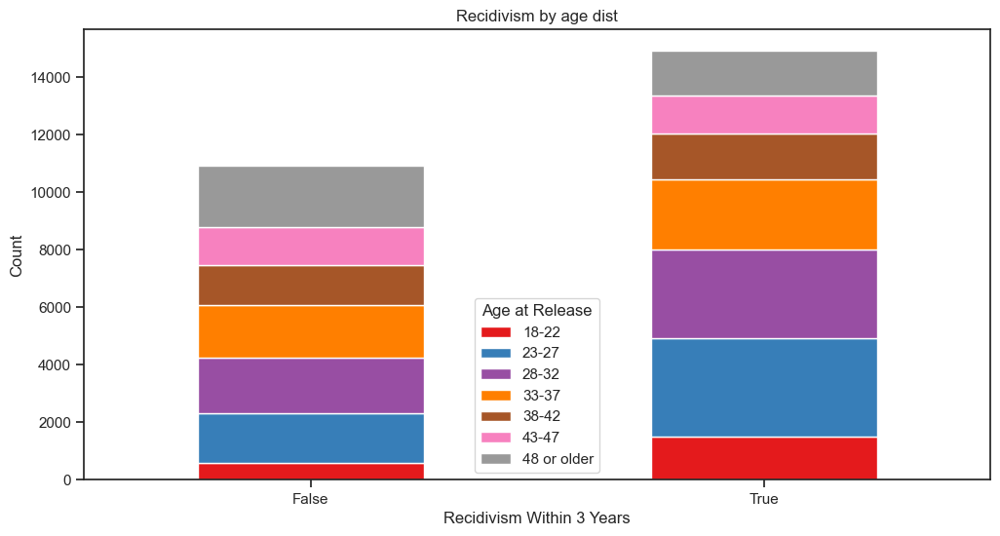

In [164]:
""" 
Recidivism by age dist

"""

recidivism_education = df.groupby(['Recidivism_Within_3years', 'Age_at_Release']).size().unstack().fillna(0)
recidivism_education.plot(kind='bar', stacked=True, colormap='Set1', figsize=(12, 6))
plt.title('Recidivism by age dist')
plt.xlabel('Recidivism Within 3 Years')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend(title='Age at Release')
plt.show()



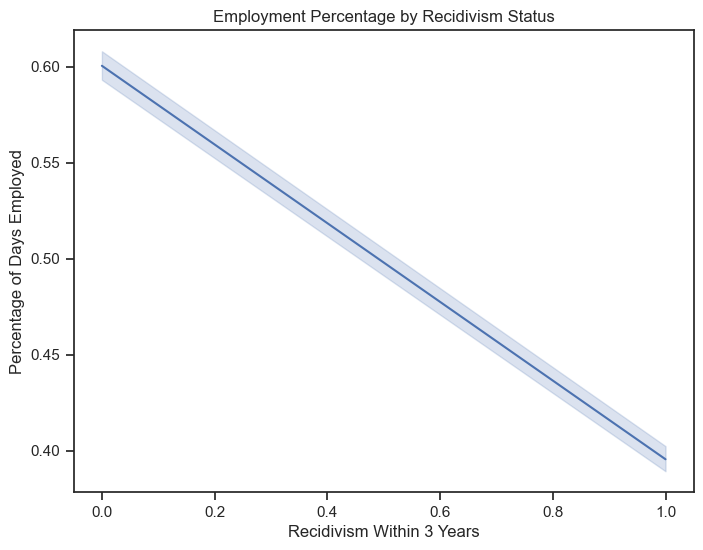

In [161]:
""" 
Recidivism distribution by Percent_Days_Employed

"""

plt.figure(figsize=(8, 6))
#sns.boxplot(x='Recidivism_Within_3years', y='Percent_Days_Employed', data=df, palette='Set1')
sns.lineplot(x='Recidivism_Within_3years', y='Percent_Days_Employed', data=df, palette='Set1')
plt.title('Employment Percentage by Recidivism Status')
plt.xlabel('Recidivism Within 3 Years')
plt.ylabel('Percentage of Days Employed')
plt.show()

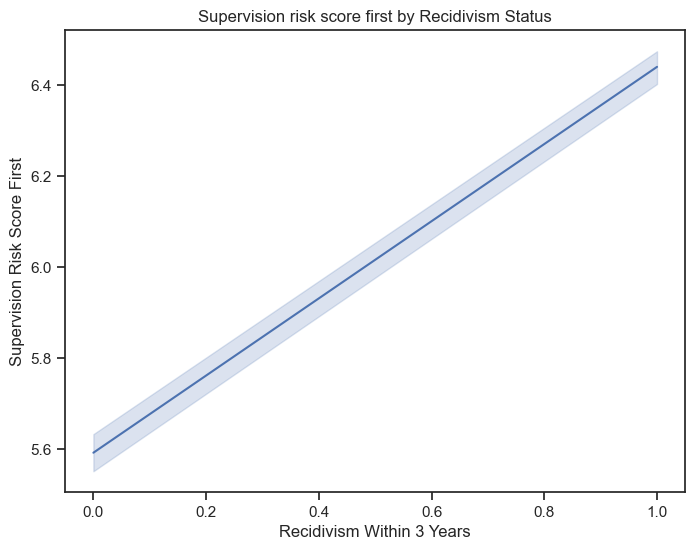

In [169]:
""" 
Recidivism distribution by Supervision_Risk_Score_First

"""
plt.figure(figsize=(8, 6))
sns.lineplot(x='Recidivism_Within_3years', y='Supervision_Risk_Score_First', data=df, palette='Set1')
plt.title('Supervision risk score first by Recidivism Status')
plt.xlabel('Recidivism Within 3 Years')
plt.ylabel('Supervision Risk Score First')
plt.show()

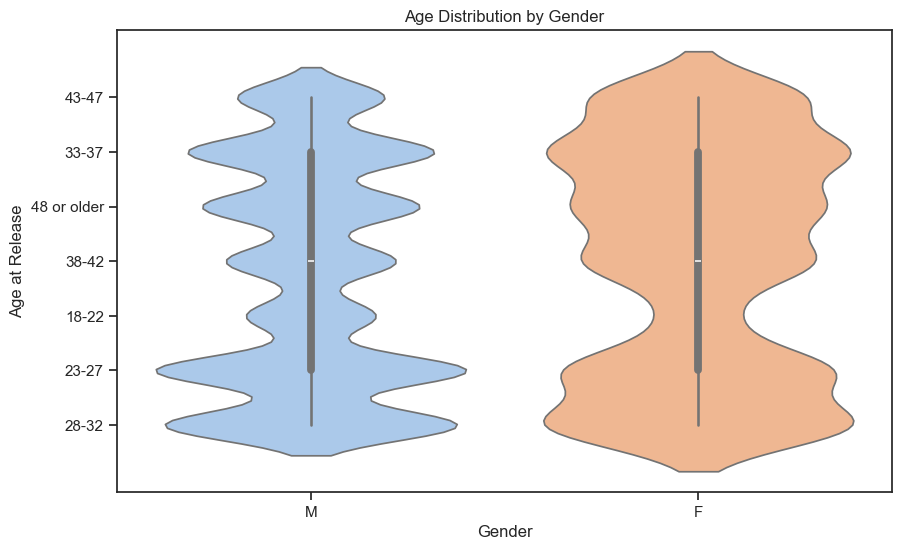

In [162]:
""" 
Age at release by gender

"""

plt.figure(figsize=(10, 6))
sns.violinplot(x='Gender', y='Age_at_Release', data=df, palette='pastel')
plt.title('Age Distribution by Gender')
plt.xlabel('Gender')
plt.ylabel('Age at Release')
plt.show()

In [ ]:
"""
NOTE: Takes a lot of time.  be careful before running. cell
"""

In [ ]:
# pause of 10 sec.... 
import time
time.sleep(10)


In [174]:
""" 
PairGrid with KDEs provides a way to visualize feature relationships while showing the distribution of features and their relationship with recidivism.


NOTE: Takes a lot of time.  be careful before running. cell
"""
"""
g = sns.PairGrid(df, hue='Recidivism_Within_3years', palette='husl', height=2.5)
g.map_upper(sns.scatterplot)
g.map_diag(sns.histplot, kde_kws={'color': 'k'})
g.map_lower(sns.kdeplot, cmap='Blues_d', fill=True)
g.add_legend(title='Recidivism Within 3 Years')
plt.suptitle('PairGrid with KDEs by Recidivism', y=1.02)
plt.show()
"""

"\ng = sns.PairGrid(df, hue='Recidivism_Within_3years', palette='husl', height=2.5)\ng.map_upper(sns.scatterplot)\ng.map_diag(sns.histplot, kde_kws={'color': 'k'})\ng.map_lower(sns.kdeplot, cmap='Blues_d', fill=True)\ng.add_legend(title='Recidivism Within 3 Years')\nplt.suptitle('PairGrid with KDEs by Recidivism', y=1.02)\nplt.show()\n"

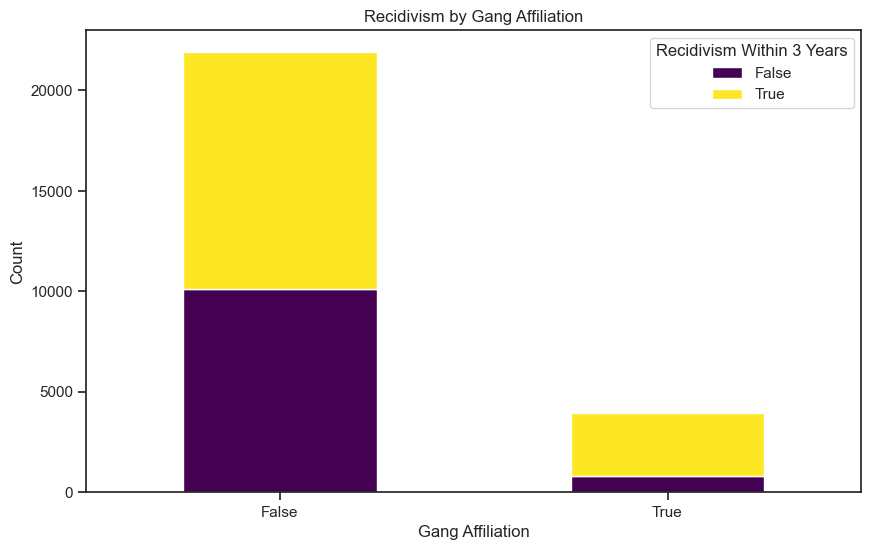

In [180]:
gang_recidivism = df.groupby(['Gang_Affiliated', 'Recidivism_Within_3years']).size().unstack().fillna(0)
gang_recidivism.plot(kind='bar', stacked=True, colormap='viridis', figsize=(10, 6))
plt.title('Recidivism by Gang Affiliation')
plt.xlabel('Gang Affiliation')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend(title='Recidivism Within 3 Years')
plt.show()

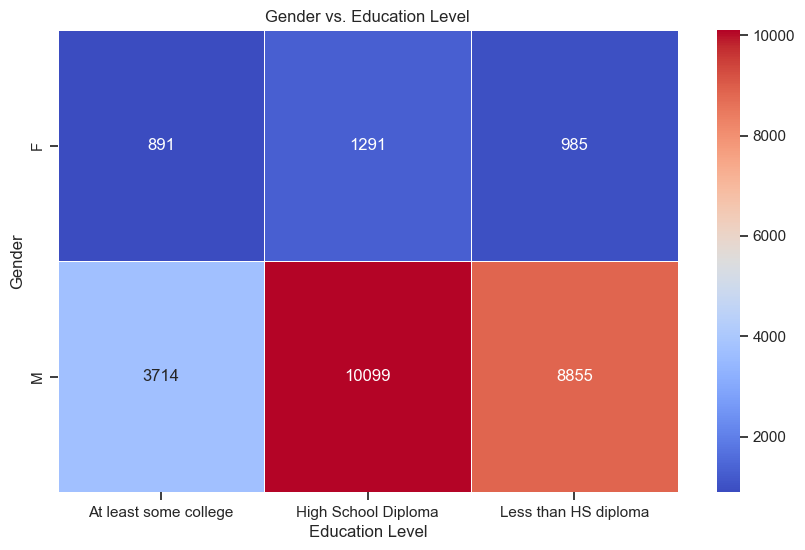

In [181]:
gender_education = df.groupby(['Gender', 'Education_Level']).size().unstack().fillna(0)
plt.figure(figsize=(10, 6))
sns.heatmap(gender_education, cmap='coolwarm', annot=True, fmt='d', linewidths=0.5)
plt.title('Gender vs. Education Level')
plt.xlabel('Education Level')
plt.ylabel('Gender')
plt.show()

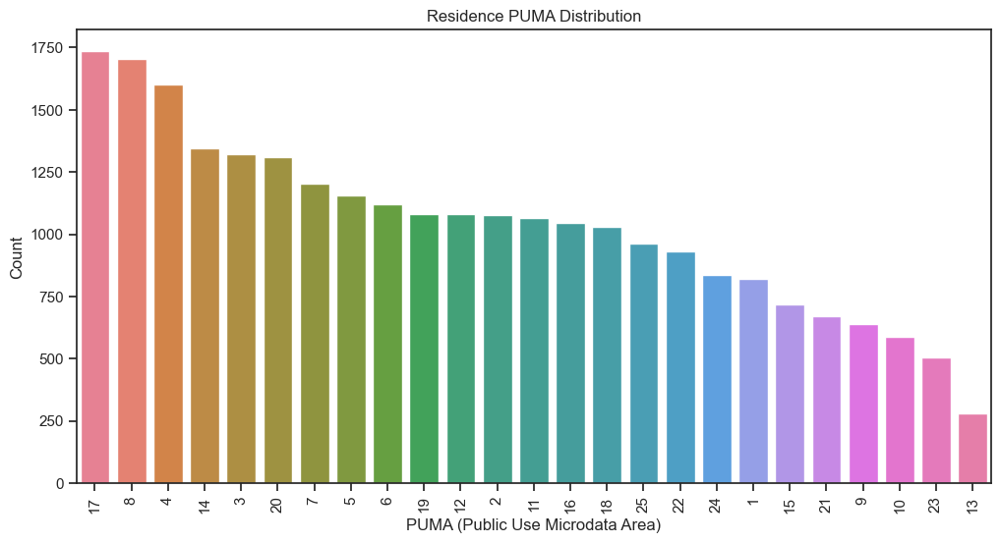

In [186]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='Residence_PUMA', palette='husl', order=df['Residence_PUMA'].value_counts().index)
plt.title('Residence PUMA Distribution')
plt.xlabel('PUMA (Public Use Microdata Area)')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()


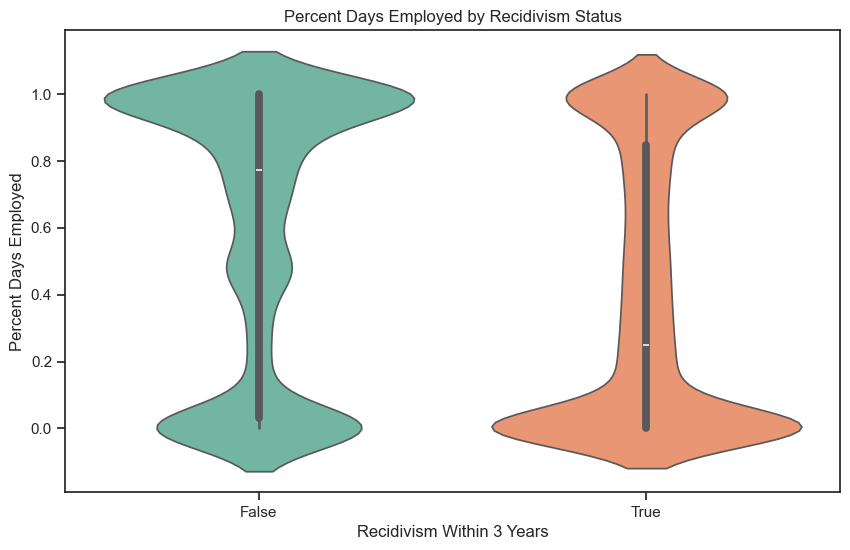

In [192]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='Recidivism_Within_3years', y='Percent_Days_Employed', data=df, palette='Set2')
plt.title('Percent Days Employed by Recidivism Status')
plt.xlabel('Recidivism Within 3 Years')
plt.ylabel('Percent Days Employed')
plt.show()

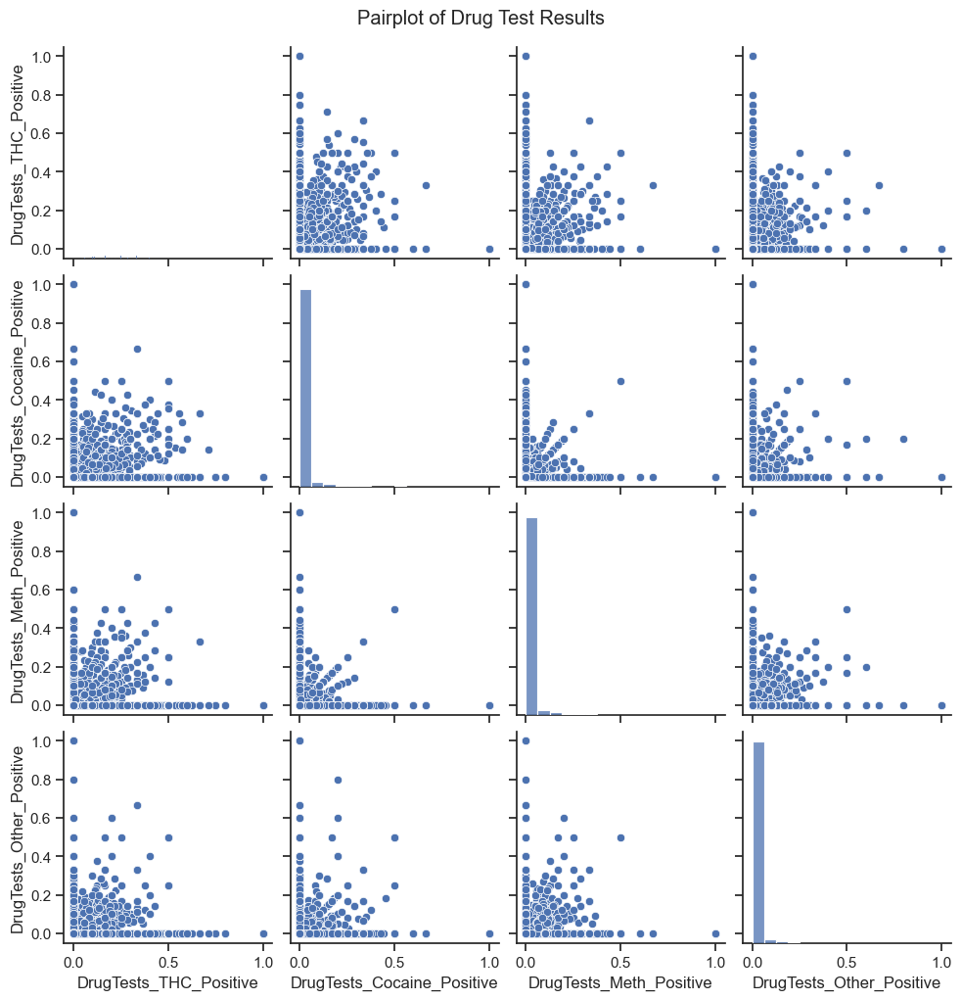

In [193]:
drug_test_results = df[['DrugTests_THC_Positive', 'DrugTests_Cocaine_Positive', 'DrugTests_Meth_Positive', 'DrugTests_Other_Positive']]
sns.pairplot(drug_test_results, diag_kind='hist', palette='viridis', height=2.5)
plt.suptitle('Pairplot of Drug Test Results', y=1.02)
plt.show()


<Figure size 1200x1000 with 0 Axes>

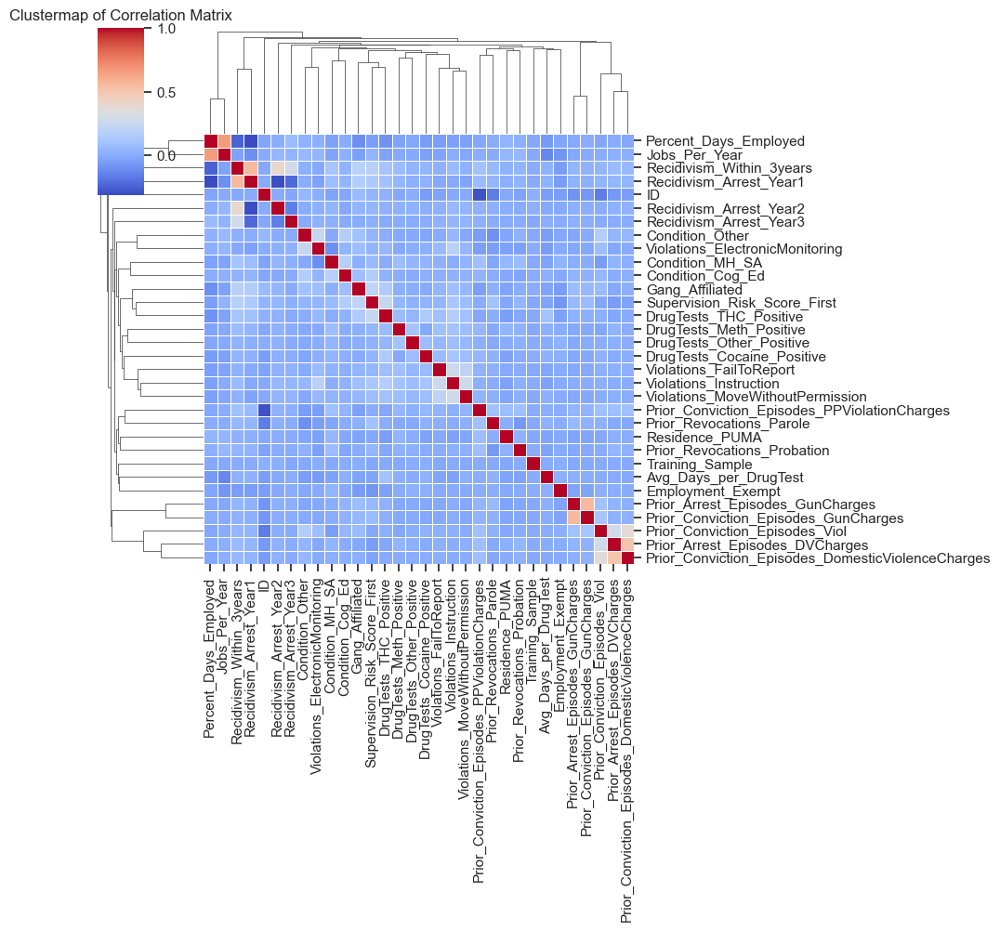

In [195]:
correlation_matrix = df.corr()
plt.figure(figsize=(12, 10))
sns.clustermap(correlation_matrix, cmap='coolwarm', linewidths=0.5)
plt.title('Clustermap of Correlation Matrix')
plt.show()

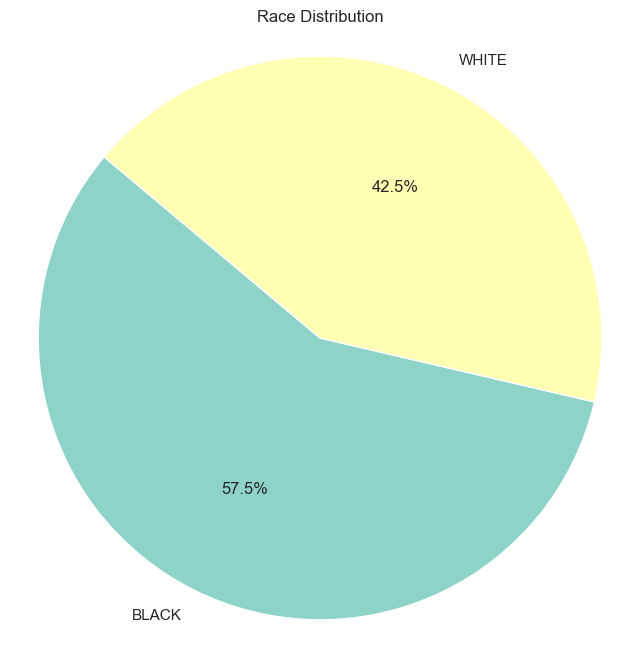

In [196]:
plt.figure(figsize=(8, 8))
race_counts = df['Race'].value_counts()
plt.pie(race_counts, labels=race_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('Set3', len(race_counts)))
plt.title('Race Distribution')
plt.axis('equal')
plt.show()

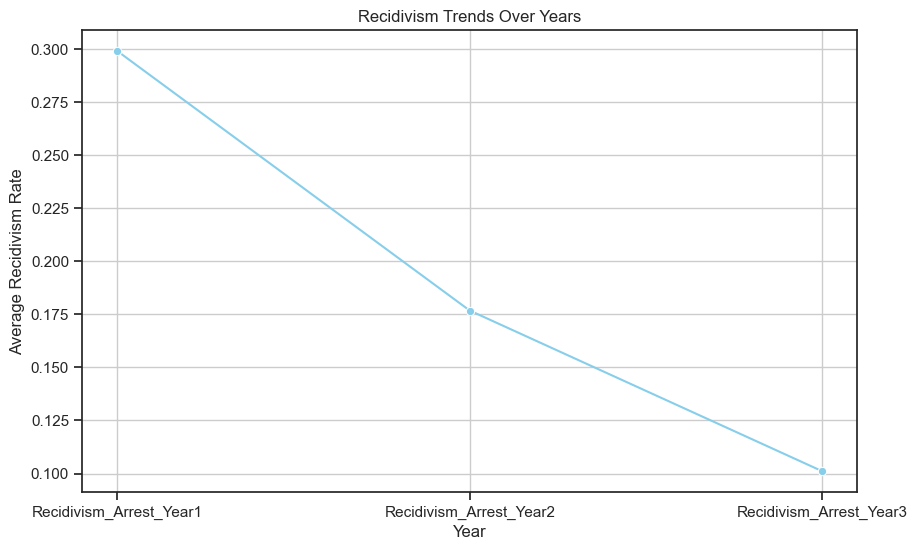

In [199]:
recidivism_yearly = df[['Recidivism_Arrest_Year1', 'Recidivism_Arrest_Year2', 'Recidivism_Arrest_Year3']].mean()
plt.figure(figsize=(10, 6))
sns.lineplot(x=recidivism_yearly.index, y=recidivism_yearly.values, marker='o', color='skyblue')
plt.title('Recidivism Trends Over Years')
plt.xlabel('Year')
plt.ylabel('Average Recidivism Rate')
plt.grid(True)
plt.show()

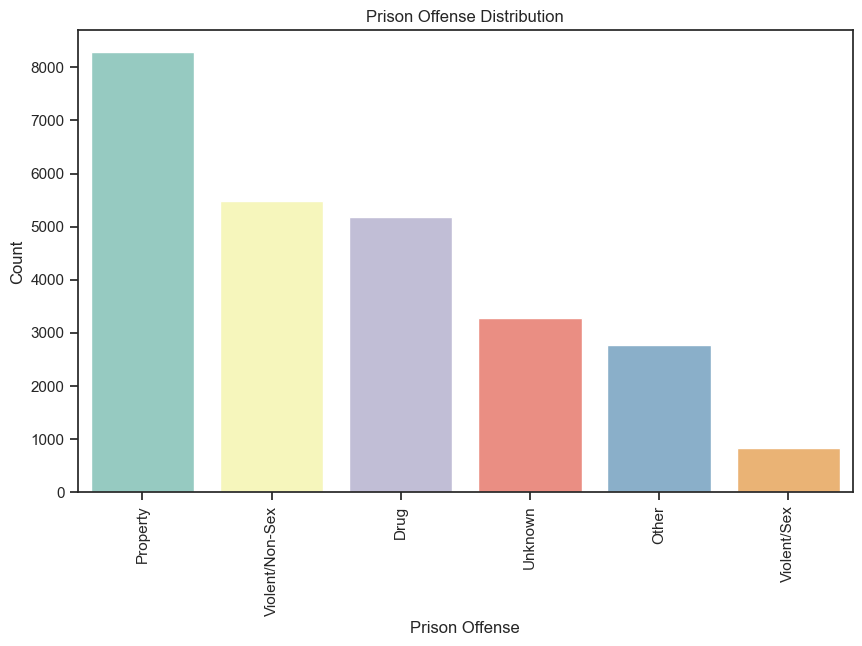

In [204]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='Prison_Offense', palette='Set3', order=df['Prison_Offense'].value_counts().index)
plt.title('Prison Offense Distribution')
plt.xlabel('Prison Offense')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

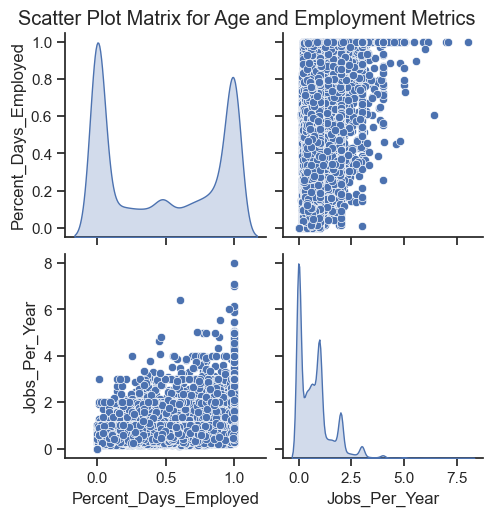

In [210]:
age_employment = df[['Age_at_Release', 'Percent_Days_Employed', 'Jobs_Per_Year']]
sns.pairplot(age_employment, diag_kind='kde', palette='Set2', height=2.5)
plt.suptitle('Scatter Plot Matrix for Age and Employment Metrics', y=1.02)
plt.show()

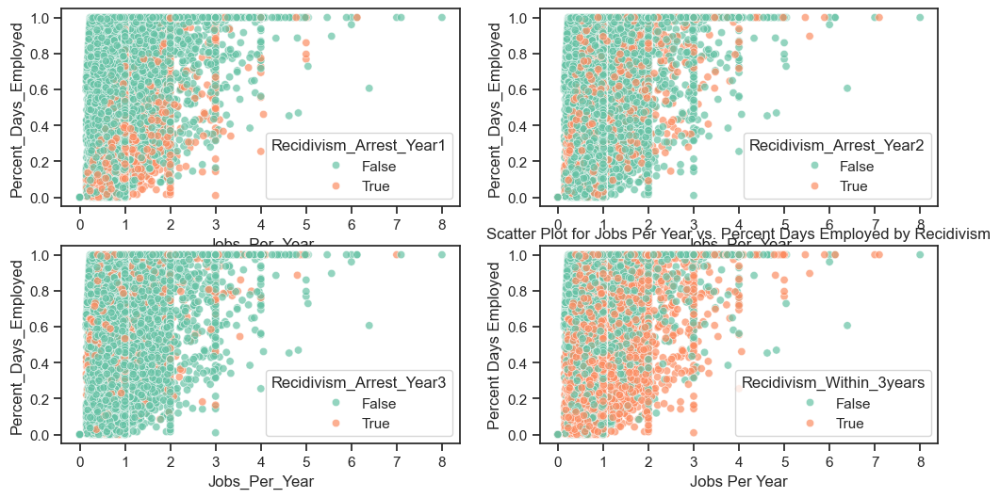

In [221]:
fig,axs = plt.subplots(2,2, figsize=(12, 6))
axs = axs.flatten()
sns.scatterplot(data=df, x='Jobs_Per_Year', y='Percent_Days_Employed', hue='Recidivism_Arrest_Year1', palette='Set2', alpha=0.7, ax=axs[0])
plt.title('Scatter Plot for Jobs Per Year vs. Percent Days Employed by Recidivism')
plt.xlabel('Jobs Per Year')
plt.ylabel('Percent Days Employed')


sns.scatterplot(data=df, x='Jobs_Per_Year', y='Percent_Days_Employed', hue='Recidivism_Arrest_Year2', palette='Set2', alpha=0.7, ax=axs[1])
plt.title('Scatter Plot for Jobs Per Year vs. Percent Days Employed by Recidivism')
plt.xlabel('Jobs Per Year')
plt.ylabel('Percent Days Employed')

sns.scatterplot(data=df, x='Jobs_Per_Year', y='Percent_Days_Employed', hue='Recidivism_Arrest_Year3', palette='Set2', alpha=0.7, ax=axs[2])
plt.title('Scatter Plot for Jobs Per Year vs. Percent Days Employed by Recidivism')
plt.xlabel('Jobs Per Year')
plt.ylabel('Percent Days Employed')


sns.scatterplot(data=df, x='Jobs_Per_Year', y='Percent_Days_Employed', hue='Recidivism_Within_3years', palette='Set2', alpha=0.7, ax=axs[3])
plt.title('Scatter Plot for Jobs Per Year vs. Percent Days Employed by Recidivism')
plt.xlabel('Jobs Per Year')
plt.ylabel('Percent Days Employed')


plt.show()

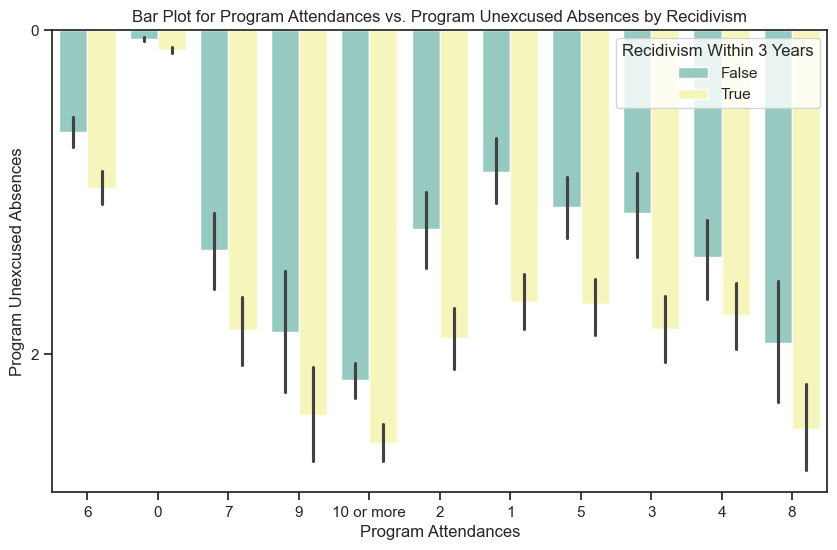

In [222]:
plt.figure(figsize=(10, 6))
sns.barplot(data=df, x='Program_Attendances', y='Program_UnexcusedAbsences', hue='Recidivism_Within_3years', palette='Set3')
plt.title('Bar Plot for Program Attendances vs. Program Unexcused Absences by Recidivism')
plt.xlabel('Program Attendances')
plt.ylabel('Program Unexcused Absences')
plt.legend(title='Recidivism Within 3 Years', loc='upper right')
plt.show()